In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import os
import seaborn as sns
import random
from collections import Counter

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from sklearn import metrics

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import EditedNearestNeighbours, NearMiss
from imblearn.combine import SMOTEENN

import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.applications import ResNet50V2, InceptionResNetV2, NASNetMobile, MobileNet
from tensorflow.keras.applications import EfficientNetV2B0, EfficientNetV2B1, EfficientNetV2B2, EfficientNetV2B3
from tensorflow.keras.applications import DenseNet121, DenseNet169, DenseNet201
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers.schedules import ExponentialDecay

from keras.regularizers import l2
import keras_tuner as kt

from scikeras.wrappers import KerasClassifier
from sklearn.model_selection import GridSearchCV

seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)
random.seed(seed)

num_classes=4

tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir='./logs')
pd.set_option('display.max_colwidth', None)

categories = ["adenocarcinoma", "large_cell_carcinoma", "normal", "squamous_cell_carcinoma"]

In [3]:
# TRAIN data

directory_train = r"lung_classification_dataset\train"

adenocarcinoma_dir = directory_train + "/" + categories[0]
large_cell_carcinoma_dir = directory_train + "/" + categories[1]
normal_dir = directory_train + "/" + categories[2]
squamos_cell_carcinoma_dir = directory_train + "/" + categories[3]

path_list_train = []
category_list_train = []
for category in categories:
    folder_path = os.path.join(directory_train, category)
    folder_image_contents = os.listdir(folder_path)
    for image_file in folder_image_contents:
        image_file_path = os.path.join(folder_path, image_file)
        path_list_train.append(image_file_path)
        category_list_train.append(category)

path_series_train = pd.Series(path_list_train, name="filepath")
category_series_train = pd.Series(category_list_train, name="category")

image_paths_train_df = pd.DataFrame(path_series_train).join(category_series_train)

#print(image_paths_train_df.head())   

# VAL data
directory_val = r"lung_classification_dataset\valid"

adenocarcinoma_dir = directory_val + "/" + categories[0]
large_cell_carcinoma_dir = directory_val + "/" + categories[1]
normal_dir = directory_val + "/" + categories[2]
squamos_cell_carcinoma_dir = directory_val + "/" + categories[3]

path_list_val = []
category_list_val = []
for category in categories:
    folder_path = os.path.join(directory_val, category)
    folder_image_contents = os.listdir(folder_path)
    for image_file in folder_image_contents:
        image_file_path = os.path.join(folder_path, image_file)
        path_list_val.append(image_file_path)
        category_list_val.append(category)

path_series_val = pd.Series(path_list_val, name="filepath")
category_series_val = pd.Series(category_list_val, name="category")

image_paths_val_df = pd.DataFrame(path_series_val).join(category_series_val)

#print(image_paths_val_df.head())

# TEST data
directory_test = r"lung_classification_dataset\test"

adenocarcinoma_dir = directory_test + "/" + categories[0]
large_cell_carcinoma_dir = directory_test + "/" + categories[1]
normal_dir = directory_test + "/" + categories[2]
squamos_cell_carcinoma_dir = directory_test + "/" + categories[3]

path_list_test = []
category_list_test = []
for category in categories:
    folder_path = os.path.join(directory_test, category)
    folder_image_contents = os.listdir(folder_path)
    for image_file in folder_image_contents:
        image_file_path = os.path.join(folder_path, image_file)
        path_list_test.append(image_file_path)
        category_list_test.append(category)

path_series_test = pd.Series(path_list_test, name="filepath")
category_series_test = pd.Series(category_list_test, name="category")

image_paths_test_df = pd.DataFrame(path_series_test).join(category_series_test)

#print(image_paths_test_df.head())

# Image Resizing

In [5]:
# TRAIN data
size_data_train = {}
is_grayscale = 0 # enter 0 for color, 1 for grayscale
for category in categories:
    folder_path = os.path.join(directory_train, category)
    folder_image_contents = os.listdir(folder_path)
    image_sizes_in_one_category = {}
    for image_file in folder_image_contents:
        image_file_path = os.path.join(folder_path, image_file)
        img = cv2.imread(image_file_path)
        height, width, channel = img.shape
        if(str(height) + " x " + str(width) in image_sizes_in_one_category):
            image_sizes_in_one_category[str(height) + " x " + str(width)] += 1
        else:
            image_sizes_in_one_category[str(height) + " x " + str(width)] = 1
    #plt.imshow(cv2.imread(image_file_path, is_grayscale))
    #plt.show()
    size_data_train[category] = image_sizes_in_one_category
size_data_train_df = pd.DataFrame(size_data_train)
#print(size_data_train)
#print(size_data_train_df.head(10))

# VAL data
size_data_val = {}
is_grayscale = 0 # enter 0 for color, 1 for grayscale
for category in categories:
    folder_path = os.path.join(directory_val, category)
    folder_image_contents = os.listdir(folder_path)
    image_sizes_in_one_category = {}
    for image_file in folder_image_contents:
        image_file_path = os.path.join(folder_path, image_file)
        img = cv2.imread(image_file_path)
        height, width, channel = img.shape
        if(str(height) + " x " + str(width) in image_sizes_in_one_category):
            image_sizes_in_one_category[str(height) + " x " + str(width)] += 1
        else:
            image_sizes_in_one_category[str(height) + " x " + str(width)] = 1
    #plt.imshow(cv2.imread(image_file_path, is_grayscale))
    #plt.show()
    size_data_val[category] = image_sizes_in_one_category
size_data_val_df = pd.DataFrame(size_data_val)
#print(size_data_val)
#print(size_data_val_df.head(10))

# TEST data
size_data_test = {}
is_grayscale = 0 # enter 0 for color, 1 for grayscale
for category in categories:
    folder_path = os.path.join(directory_test, category)
    folder_image_contents = os.listdir(folder_path)
    image_sizes_in_one_category = {}
    for image_file in folder_image_contents:
        image_file_path = os.path.join(folder_path, image_file)
        img = cv2.imread(image_file_path)
        height, width, channel = img.shape
        if(str(height) + " x " + str(width) in image_sizes_in_one_category):
            image_sizes_in_one_category[str(height) + " x " + str(width)] += 1
        else:
            image_sizes_in_one_category[str(height) + " x " + str(width)] = 1
    #plt.imshow(cv2.imread(image_file_path, is_grayscale))
    #plt.show()
    size_data_test[category] = image_sizes_in_one_category
size_data_test_df = pd.DataFrame(size_data_test)
#print(size_data_test)
#print(size_data_test_df.head(10))

In [6]:
# TRAIN data

dataset_train = []
desired_size = 256
for index, row in image_paths_train_df.iterrows():
    filepath = row["filepath"]
    img = cv2.imread(filepath, is_grayscale)
    img = cv2.resize(img, (desired_size, desired_size))
    label = row["category"]
    dataset_train.append([img, label])
    
random.shuffle(dataset_train)

#print(dataset_train[0][0].shape)
#print(dataset_train[0][1])
#plt.imshow(dataset_train[0][0])
#plt.show()

# VAL data

dataset_val = []
desired_size = 256
for index, row in image_paths_val_df.iterrows():
    filepath = row["filepath"]
    img = cv2.imread(filepath, is_grayscale)
    img = cv2.resize(img, (desired_size, desired_size))
    label = row["category"]
    dataset_val.append([img, label])
    
random.shuffle(dataset_val)

#print(dataset_val[0][0].shape)
#print(dataset_val[0][1])
#plt.imshow(dataset_val[0][0])
#plt.show()

# TEST data

dataset_test = []
desired_size = 256
for index, row in image_paths_test_df.iterrows():
    filepath = row["filepath"]
    img = cv2.imread(filepath, is_grayscale)
    img = cv2.resize(img, (desired_size, desired_size))
    label = row["category"]
    dataset_test.append([img, label])
    
random.shuffle(dataset_test)

#print(dataset_test[0][0].shape)
#print(dataset_test[0][1])
#plt.imshow(dataset_test[0][0])
#plt.show()

# Image smoothing

In [8]:
# using bilateral filtering
diameter = 3
sigma_color = 25
sigma_space = 25

# TRAIN data
for data in dataset_train:
    img = cv2.bilateralFilter(data[0], diameter, sigma_color, sigma_space)
    data[0] = img

#plt.imshow(dataset_train[0][0])
#plt.show()

# VAL data
for data in dataset_val:
    img = cv2.bilateralFilter(data[0], diameter, sigma_color, sigma_space)
    data[0] = img

#plt.imshow(dataset_val[0][0])
#plt.show()

# TEST data
for data in dataset_test:
    img = cv2.bilateralFilter(data[0], diameter, sigma_color, sigma_space)
    data[0] = img

#plt.imshow(dataset_test[0][0])
#plt.show()

# Data normalization

In [10]:
# using min-max scaling

# TRAIN data
for data in dataset_train:
    img = data[0]/255.0
    data[0] = img

#plt.imshow(dataset_train[0][0])
#plt.show()

# VAL data
for data in dataset_val:
    img = data[0]/255.0
    data[0] = img

#plt.imshow(dataset_val[0][0])
#plt.show()

# TEST data
for data in dataset_test:
    img = data[0]/255.0
    data[0] = img

#plt.imshow(dataset_test[0][0])
#plt.show()

# Data splitting

In [12]:
x_train, y_train = [], []
x_val, y_val = [], []
x_test, y_test = [], []

for image, category in dataset_train:
    x_train.append(image)
    y_train.append(category)

for image, category in dataset_val:
    x_val.append(image)
    y_val.append(category)

for image, category in dataset_test:
    x_test.append(image)
    y_test.append(category)


x_train = np.array(x_train)
y_train = np.array(y_train)
x_val = np.array(x_val)
y_val = np.array(y_val)
x_test = np.array(x_test)
y_test = np.array(y_test)

label_encoder = LabelEncoder()

y_train = label_encoder.fit_transform(y_train)
y_val = label_encoder.transform(y_val)
y_test = label_encoder.transform(y_test)

# apply one-hot encoding

y_val = to_categorical(y_val, num_classes=num_classes)
y_test = to_categorical(y_test, num_classes=num_classes)

y_test_labels = np.argmax(y_test, axis=1)

for i in range(0, len(label_encoder.classes_)):
    print(i, end="")
    print(" = ", end="")
    print(label_encoder.classes_[i])

0 = adenocarcinoma
1 = large_cell_carcinoma
2 = normal
3 = squamous_cell_carcinoma


# Handling data imbalance

In [14]:
# using SMOTE (like example)
print(x_train.shape)
number_of_samples = x_train.shape[0]
x_train = x_train.reshape(number_of_samples, -1)
print(x_train.shape)

print("before: ", Counter(y_train))

sample_nums = max(Counter(y_train).values()) * 2
sampling_strategy = {1: sample_nums, 2: sample_nums, 0: sample_nums, 3: sample_nums}

x_train_smt, y_train_smt = SMOTE(sampling_strategy=sampling_strategy, random_state=42).fit_resample(x_train, y_train)

print("after: ", Counter(y_train_smt))
x_train = x_train.reshape(number_of_samples, desired_size, desired_size, 1)
x_train_smt = x_train_smt.reshape(x_train_smt.shape[0], desired_size, desired_size, 1)
print(x_train.shape)
print(x_train_smt.shape)

y_train_smt = to_categorical(y_train_smt, num_classes=num_classes)

x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
x_val = np.expand_dims(x_val, axis=-1)
x_val = np.repeat(x_val, 3, axis=-1)
x_test = np.expand_dims(x_test, axis=-1)
x_test = np.repeat(x_test, 3, axis=-1)

(613, 256, 256)
(613, 65536)
before:  Counter({0: 195, 3: 155, 2: 148, 1: 115})
after:  Counter({1: 390, 0: 390, 2: 390, 3: 390})
(613, 256, 256, 1)
(1560, 256, 256, 1)


In [15]:
import psutil
print(f"Available Memory: {psutil.virtual_memory().available / 1e9:.2f} GB")


Available Memory: 2.46 GB


# Data Models

In [17]:
def all_evaluation(y_test_labels, y_pred_labels, model, epoch_num, batch, is_tuning=False):
    output_path = 'output2\\' + model + '_epoch' + str(epoch_num) + '_batch' + str(batch)
    if not os.path.exists(output_path):
        os.makedirs(output_path)
    # Accuracy, precision, recall, f1 score
    print(metrics.classification_report(y_test_labels, y_pred_labels, digits=4))
    report = metrics.classification_report(y_test_labels, y_pred_labels, digits=4)
    cm = metrics.confusion_matrix(y_test_labels, y_pred_labels)
    
    print(f"The Cohen's Kappa Score is: {metrics.cohen_kappa_score(y_test_labels, y_pred_labels)}")
    cohen = metrics.cohen_kappa_score(y_test_labels, y_pred_labels)
    with open(output_path + '\\evaluation_report.txt', 'w') as f:
        f.write(report)
        f.write('\n')
        f.write('The Cohen\'s Kappa Score is: ' + str(cohen))

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=['Adenocarcinoma', 'Large_cell_carcinoma', 'normal', 'squamous_cell_carcinoma'],
                yticklabels=['Adenocarcinoma', 'Large_cell_carcinoma', 'normal', 'squamous_cell_carcinoma'])
    plt.xlabel("Predicted Labels", fontsize=14)
    plt.ylabel("True Labels", fontsize=14)
    plt.savefig(output_path + '\\confusion_matrix.jpg')
    plt.show()

### Using CNN

In [ ]:
%%time

model_name = 'cnn'
epoch_num = 30
batch = 16

# cnn model
def build_model_cnn(optimizer="adam", dropout_rate=0.5):
    model = Sequential()
    model.add(Conv2D(128, (3, 3), activation="relu", input_shape=(x_train_smt.shape[1:])))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(128, (3, 3), activation="relu"))
    model.add(MaxPooling2D(2, 2))
    model.add(Conv2D(64, (3, 3), activation="relu"))
    model.add(MaxPooling2D(2, 2))
    model.add(Flatten())
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))
    
    model.compile(optimizer=optimizer, 
                  loss=tf.keras.losses.CategoricalCrossentropy(), 
                  metrics=["accuracy"])
    return model

model_cnn = build_model_cnn()
model_cnn.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7)

history_cnn = model_cnn.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_cnn.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_cnn.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_cnn.history['loss'], color='silver', label='loss')
plt.plot(history_cnn.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_cnn.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

### Using ResNet50V2

Model: "functional_19"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_19      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, None,      │          0 │ input_layer_19[0… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, None,      │      9,472 │ conv1_pad[0][0]   │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, None,      │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, None,      │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, None,      │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, None,      │          0 │ conv2_block1_pre… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, None,      │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, None,      │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, None,      │          0 │ conv2_block1_1_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, None,      │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, None,      │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, None,      │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, None,      │          0 │ conv2_block1_2_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, None,      │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, None,      │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, None,      │          0 │ conv2_block1_0_c

 Total params: 25,671,172 (97.93 MB)

 Trainable params: 5,520,388 (21.06 MB)

 Non-trainable params: 20,150,784 (76.87 MB)

Epoch 1/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 43s 789ms/step - accuracy: 0.7105 - loss: 1.0202 - val_accuracy: 0.5278 - val_loss: 2.2874 - learning_rate: 0.0010
Epoch 2/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 39s 793ms/step - accuracy: 0.9662 - loss: 0.1036 - val_accuracy: 0.8056 - val_loss: 0.6888 - learning_rate: 0.0010
Epoch 3/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 37s 750ms/step - accuracy: 0.9937 - loss: 0.0285 - val_accuracy: 0.8056 - val_loss: 0.6052 - learning_rate: 0.0010
Epoch 4/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 38s 780ms/step - accuracy: 0.9963 - loss: 0.0111 - val_accuracy: 0.8056 - val_loss: 0.5530 - learning_rate: 0.0010
Epoch 5/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 39s 805ms/step - accuracy: 0.9968 - loss: 0.0090 - val_accuracy: 0.8333 - val_loss: 0.6704 - learning_rate: 0.0010
Epoch 6/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 38s 779ms/step - accuracy: 0.9989 - loss: 0.0042 - val_accuracy: 0.8750 - val_loss: 0.3869 - learning_rate: 0.0010
Epoch 7/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 39s 796ms/step - accuracy: 1.0000 - loss: 0.

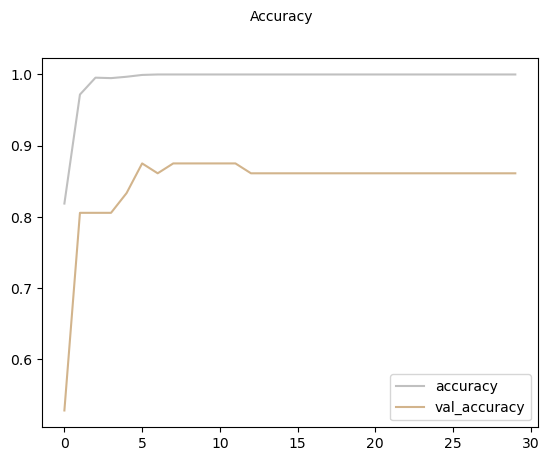

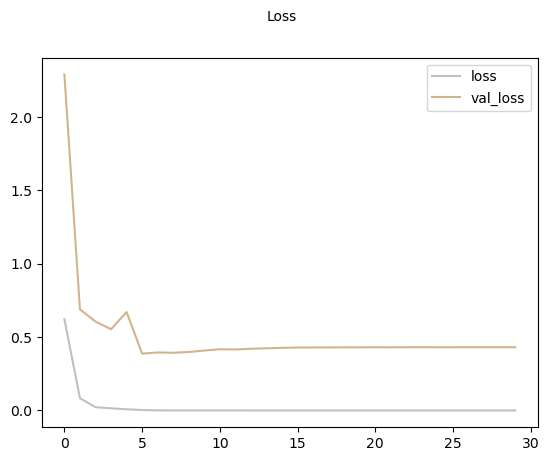

10/10 ━━━━━━━━━━━━━━━━━━━━ 9s 782ms/step
              precision    recall  f1-score   support

           0     0.8175    0.8583    0.8374       120
           1     0.7895    0.8824    0.8333        51
           2     1.0000    0.9630    0.9811        54
           3     0.8500    0.7556    0.8000        90

    accuracy                         0.8508       315
   macro avg     0.8642    0.8648    0.8630       315
weighted avg     0.8535    0.8508    0.8507       315

The Cohen's Kappa Score is: 0.7920353982300885


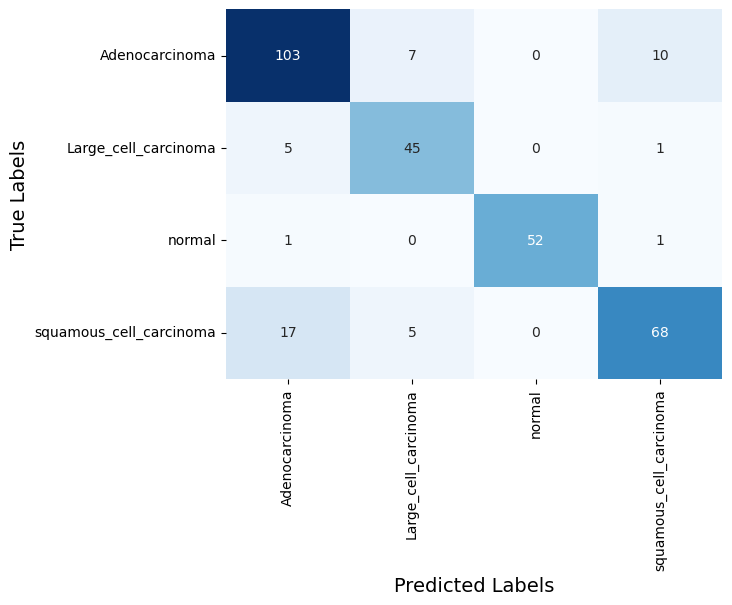

CPU times: total: 12min 36s
Wall time: 19min 21s


In [60]:
%%time
model_name = 'resnet50v2'
epoch_num = 30
batch = 32

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

def build_model_ResNet50V2():
    base_model = ResNet50V2(weights='imagenet', include_top=False)
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_resnet50v2 = build_model_ResNet50V2()
model_resnet50v2.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7)

history_resnet50v2 = model_resnet50v2.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_resnet50v2.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_resnet50v2.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_resnet50v2.history['loss'], color='silver', label='loss')
plt.plot(history_resnet50v2.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_resnet50v2.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

Model: "functional_14"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_14      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, None,      │          0 │ input_layer_14[0… │
│ (ZeroPadding2D)     │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, None,      │      9,472 │ conv1_pad[0][0]   │
│                     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, None,      │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, None,      │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, None,      │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, None,      │          0 │ conv2_block1_pre… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, None,      │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, None,      │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, None,      │          0 │ conv2_block1_1_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, None,      │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, None,      │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, None,      │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, None,      │          0 │ conv2_block1_2_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, None,      │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, None,      │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ None, 256)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, None,      │          0 │ conv2_block1_0_c

 Total params: 25,671,172 (97.93 MB)

 Trainable params: 5,520,388 (21.06 MB)

 Non-trainable params: 20,150,784 (76.87 MB)

Epoch 1/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 47s 872ms/step - accuracy: 0.7251 - loss: 0.9914 - val_accuracy: 0.6528 - val_loss: 1.4378 - learning_rate: 0.0010
Epoch 2/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 39s 795ms/step - accuracy: 0.9628 - loss: 0.1340 - val_accuracy: 0.8194 - val_loss: 1.1749 - learning_rate: 0.0010
Epoch 3/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 40s 826ms/step - accuracy: 0.9889 - loss: 0.0215 - val_accuracy: 0.7917 - val_loss: 0.7685 - learning_rate: 0.0010
Epoch 4/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 41s 841ms/step - accuracy: 0.9993 - loss: 0.0050 - val_accuracy: 0.7778 - val_loss: 0.7730 - learning_rate: 0.0010
Epoch 5/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 41s 832ms/step - accuracy: 0.9992 - loss: 0.0043 - val_accuracy: 0.8472 - val_loss: 0.4687 - learning_rate: 0.0010
Epoch 6/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 39s 803ms/step - accuracy: 0.9993 - loss: 0.0081 - val_accuracy: 0.8194 - val_loss: 0.5925 - learning_rate: 0.0010
Epoch 7/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 41s 841ms/step - accuracy: 0.9994 - loss: 0.

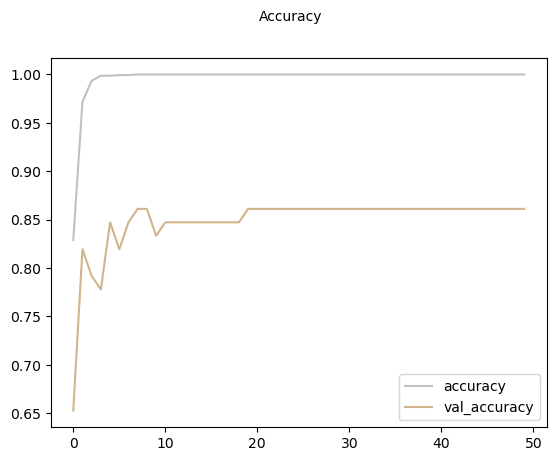

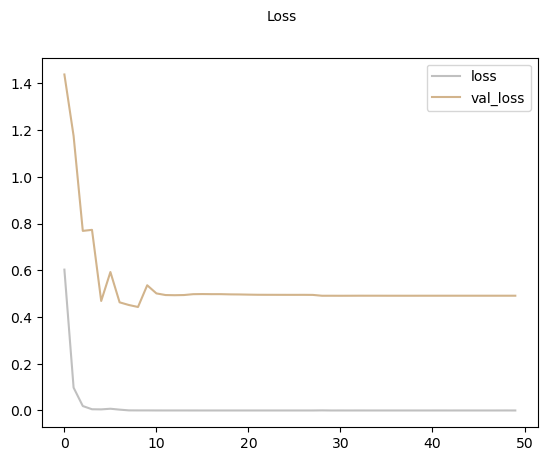

10/10 ━━━━━━━━━━━━━━━━━━━━ 9s 769ms/step
              precision    recall  f1-score   support

           0     0.7768    0.7250    0.7500       120
           1     0.7344    0.9216    0.8174        51
           2     1.0000    0.9815    0.9907        54
           3     0.7674    0.7333    0.7500        90

    accuracy                         0.8032       315
   macro avg     0.8197    0.8403    0.8270       315
weighted avg     0.8055    0.8032    0.8022       315

The Cohen's Kappa Score is: 0.7284445000625703


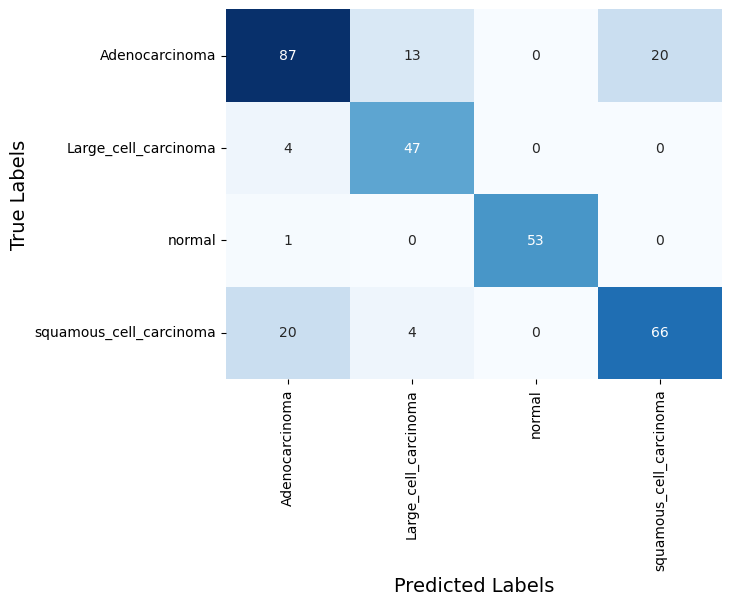

CPU times: total: 27min 34s
Wall time: 33min 48s


In [47]:
%%time
model_name = 'resnet50v2'
epoch_num = 50
batch = 32

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

def build_model_ResNet50V2():
    base_model = ResNet50V2(weights='imagenet', include_top=False)
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_resnet50v2 = build_model_ResNet50V2()
model_resnet50v2.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7)

history_resnet50v2 = model_resnet50v2.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_resnet50v2.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_resnet50v2.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_resnet50v2.history['loss'], color='silver', label='loss')
plt.plot(history_resnet50v2.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_resnet50v2.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

### using NasNetMobile

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv1 (Conv2D) │ (None, 111, 111,  │        864 │ input_layer_7[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn1            │ (None, 111, 111,  │        128 │ stem_conv1[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_188      │ (None, 111, 111,  │          0 │ stem_bn1[0][0]    │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reduction_conv_1_s… │ (None, 111, 111,  │        352 │ activation_188[0… │
│ (Conv2D)            │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reduction_bn_1_ste… │ (None, 111, 111,  │         44 │ reduction_conv_1… │
│ (BatchNormalizatio… │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_189      │ (None, 111, 111,  │          0 │ reduction_bn_1_s… │
│ (Activation)        │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_191      │ (None, 111, 111,  │          0 │ stem_bn1[0][0]    │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_p… │ (None, 115, 115,  │          0 │ activation_189[0… │
│ (ZeroPadding2D)     │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_p… │ (None, 117, 117,  │          0 │ activation_191[0… │
│ (ZeroPadding2D)     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_r… │ (None, 56, 56,    │        396 │ separable_conv_1… │
│ (SeparableConv2D)   │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_r… │ (None, 56, 56,    │      1,920 │ separable_conv_1… │
│ (SeparableConv2D)   │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_b… │ (None, 56, 56,    │         44 │ separable_conv_1… │
│ (BatchNormalizatio… │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_b… │ (None, 56, 56,    │         44 │ separable_conv_1… │
│ (BatchNormalizatio… │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_190      │ (None, 56, 56,    │          0 │ separable_conv_1… │
│ (Activation)        │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_192      │ (None, 56, 56,    │          0 │ separable_conv_1… │
│ (Activation)        │ 11)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_2_r… │ (None, 56, 56,    │        396 │ activation_190[0

 Total params: 5,360,280 (20.45 MB)

 Trainable params: 1,088,868 (4.15 MB)

 Non-trainable params: 4,271,412 (16.29 MB)

Epoch 1/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 22s 113ms/step - accuracy: 0.5754 - loss: 1.2883 - val_accuracy: 0.5417 - val_loss: 1.4332 - learning_rate: 0.0010
Epoch 2/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - accuracy: 0.8346 - loss: 0.4510 - val_accuracy: 0.5694 - val_loss: 1.6896 - learning_rate: 0.0010
Epoch 3/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 9s 94ms/step - accuracy: 0.8803 - loss: 0.3252 - val_accuracy: 0.5833 - val_loss: 1.8213 - learning_rate: 0.0010
Epoch 4/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - accuracy: 0.9142 - loss: 0.2597 - val_accuracy: 0.6944 - val_loss: 1.3237 - learning_rate: 0.0010
Epoch 5/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 9s 95ms/step - accuracy: 0.9295 - loss: 0.2232 - val_accuracy: 0.7083 - val_loss: 1.2231 - learning_rate: 0.0010
Epoch 6/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 9s 93ms/step - accuracy: 0.9465 - loss: 0.1512 - val_accuracy: 0.7361 - val_loss: 1.3729 - learning_rate: 0.0010
Epoch 7/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 9s 96ms/step - accuracy: 0.9380 - loss: 0.1604 - val_a

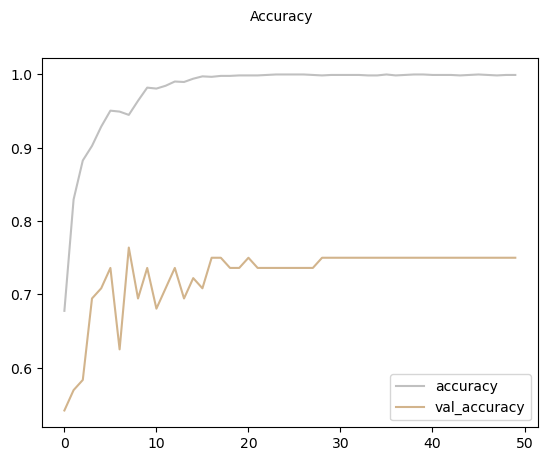

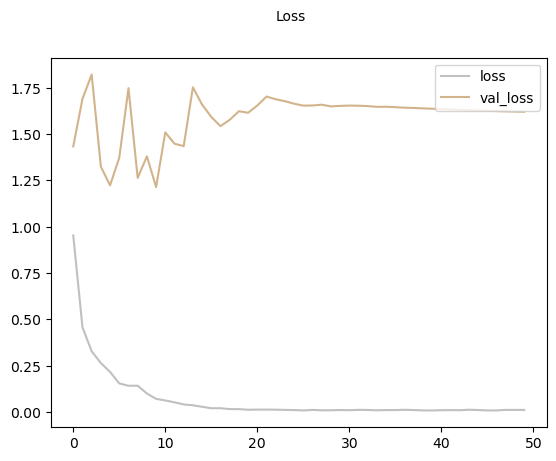

10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 479ms/step
              precision    recall  f1-score   support

           0     0.6641    0.7250    0.6932       120
           1     0.5185    0.5490    0.5333        51
           2     0.9138    0.9815    0.9464        54
           3     0.6667    0.5333    0.5926        90

    accuracy                         0.6857       315
   macro avg     0.6908    0.6972    0.6914       315
weighted avg     0.6841    0.6857    0.6820       315

The Cohen's Kappa Score is: 0.5616328596128706


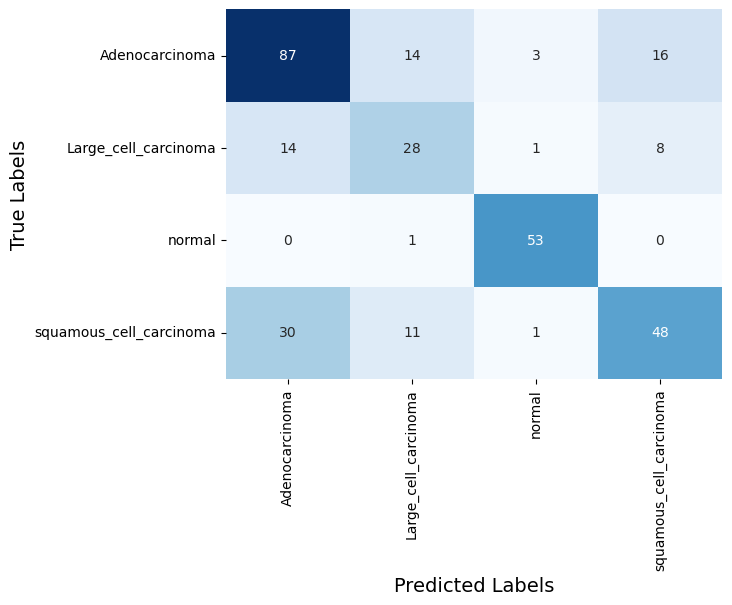

CPU times: total: 10min 6s
Wall time: 8min 17s


In [37]:
%%time

model_name = 'nasnetmobile'
epoch_num = 50
batch = 16

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

x_train_smt = tf.image.resize(x_train_smt, (224, 224)).numpy()
x_val = tf.image.resize(x_val, (224, 224)).numpy()
x_test = tf.image.resize(x_test, (224, 224)).numpy()


def build_model_nasnetmobile():
    base_model = NASNetMobile(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_nasnetmobile = build_model_nasnetmobile()
model_nasnetmobile.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7)

history_nasnetmobile = model_nasnetmobile.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_nasnetmobile.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_nasnetmobile.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_nasnetmobile.history['loss'], color='silver', label='loss')
plt.plot(history_nasnetmobile.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_nasnetmobile.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

### Using MobileNet

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_8[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 3,577,924 (13.65 MB)

 Trainable params: 2,050,372 (7.82 MB)

 Non-trainable params: 1,527,552 (5.83 MB)

Epoch 1/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 13s 94ms/step - accuracy: 0.7094 - loss: 1.1342 - val_accuracy: 0.3611 - val_loss: 12.4907 - learning_rate: 0.0010
Epoch 2/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 8s 86ms/step - accuracy: 0.9228 - loss: 0.2128 - val_accuracy: 0.2222 - val_loss: 22.8895 - learning_rate: 0.0010
Epoch 3/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 9s 91ms/step - accuracy: 0.9510 - loss: 0.1312 - val_accuracy: 0.4861 - val_loss: 10.6919 - learning_rate: 0.0010
Epoch 4/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - accuracy: 0.9801 - loss: 0.0622 - val_accuracy: 0.3472 - val_loss: 10.2499 - learning_rate: 0.0010
Epoch 5/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - accuracy: 0.9787 - loss: 0.0525 - val_accuracy: 0.2917 - val_loss: 17.6560 - learning_rate: 0.0010
Epoch 6/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 10s 97ms/step - accuracy: 0.9967 - loss: 0.0185 - val_accuracy: 0.2222 - val_loss: 26.8634 - learning_rate: 0.0010
Epoch 7/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 9s 90ms/step - accuracy: 0.9922 - loss: 0.0209 -

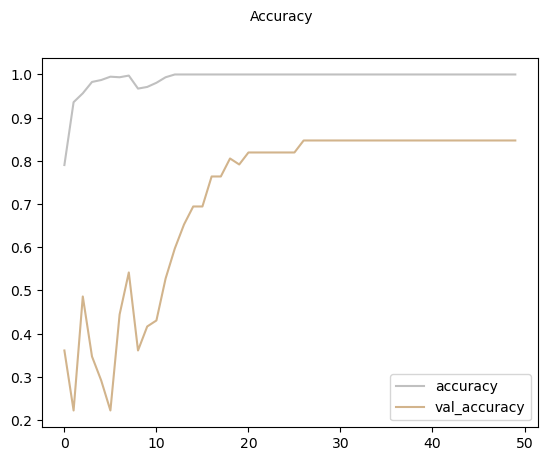

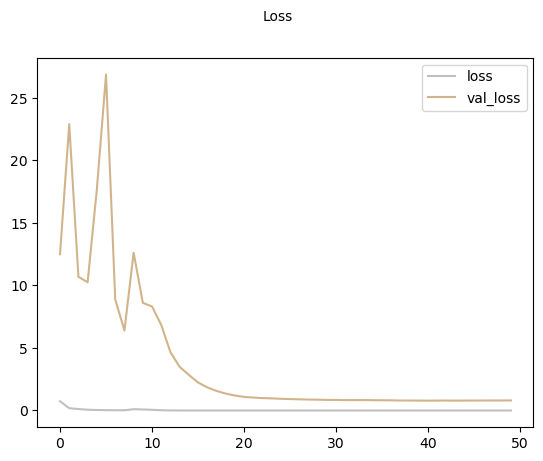

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 241ms/step
              precision    recall  f1-score   support

           0     0.8889    0.5333    0.6667       120
           1     0.5568    0.9608    0.7050        51
           2     0.9464    0.9815    0.9636        54
           3     0.6768    0.7444    0.7090        90

    accuracy                         0.7397       315
   macro avg     0.7672    0.8050    0.7611       315
weighted avg     0.7844    0.7397    0.7359       315

The Cohen's Kappa Score is: 0.6517131184013591


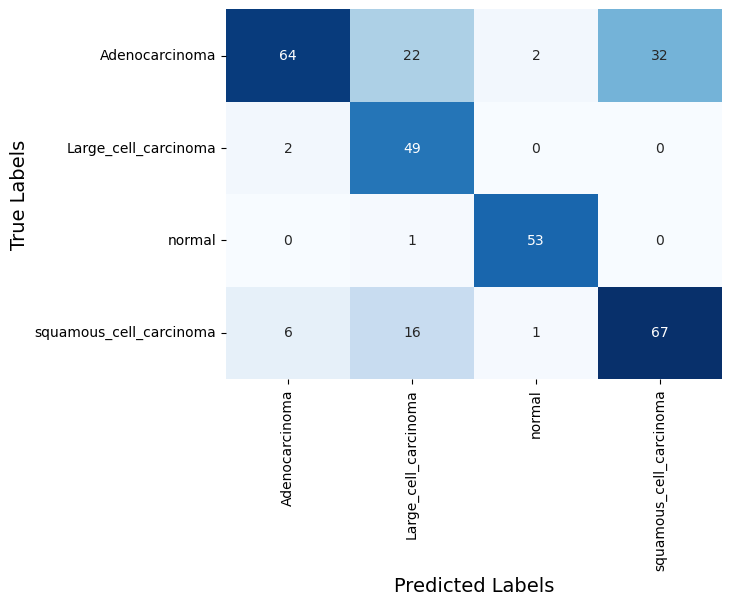

CPU times: total: 6min 53s
Wall time: 7min 49s


In [39]:
%%time
from tensorflow.keras.applications import MobileNetV2

model_name = 'mobilenetv2'
epoch_num = 50
batch = 16

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

x_train_smt = tf.image.resize(x_train_smt, (224, 224)).numpy()
x_val = tf.image.resize(x_val, (224, 224)).numpy()
x_test = tf.image.resize(x_test, (224, 224)).numpy()


def build_model_mobilenetv2():
    base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_mobilenetv2 = build_model_mobilenetv2()
model_mobilenetv2.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7)

history_mobilenetv2 = model_mobilenetv2.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_mobilenetv2.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_mobilenetv2.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_mobilenetv2.history['loss'], color='silver', label='loss')
plt.plot(history_mobilenetv2.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_mobilenetv2.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

### EfficientNetV2 variations

#### EfficientNetV2B0

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_3[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1a_project_… │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, None,      │     36,864 │ block2a_project_… │
│ (Conv2D)            │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, None,      │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, None,      │          0 │ block2b_expand_b… │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_co… │ (None, None,      │      4,096 │ block2b_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_project_bn  │ (None, None,      │        128 │ block2b_project_

 Total params: 7,239,252 (27.62 MB)

 Trainable params: 1,899,572 (7.25 MB)

 Non-trainable params: 5,339,680 (20.37 MB)

Epoch 1/30
98/98 ━━━━━━━━━━━━━━━━━━━━ 20s 132ms/step - accuracy: 0.6404 - loss: 1.3507 - val_accuracy: 0.7361 - val_loss: 0.6006 - learning_rate: 0.0010
Epoch 2/30
98/98 ━━━━━━━━━━━━━━━━━━━━ 13s 137ms/step - accuracy: 0.8552 - loss: 0.4101 - val_accuracy: 0.7361 - val_loss: 0.6535 - learning_rate: 0.0010
Epoch 3/30
98/98 ━━━━━━━━━━━━━━━━━━━━ 14s 138ms/step - accuracy: 0.8974 - loss: 0.3113 - val_accuracy: 0.8333 - val_loss: 0.4560 - learning_rate: 0.0010
Epoch 4/30
98/98 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - accuracy: 0.9345 - loss: 0.2109 - val_accuracy: 0.8333 - val_loss: 0.7022 - learning_rate: 0.0010
Epoch 5/30
98/98 ━━━━━━━━━━━━━━━━━━━━ 13s 129ms/step - accuracy: 0.9555 - loss: 0.1358 - val_accuracy: 0.8750 - val_loss: 0.5189 - learning_rate: 0.0010
Epoch 6/30
98/98 ━━━━━━━━━━━━━━━━━━━━ 13s 136ms/step - accuracy: 0.9573 - loss: 0.1447 - val_accuracy: 0.8472 - val_loss: 0.5637 - learning_rate: 0.0010
Epoch 7/30
98/98 ━━━━━━━━━━━━━━━━━━━━ 13s 135ms/step - accuracy: 0.9691 - loss: 0.

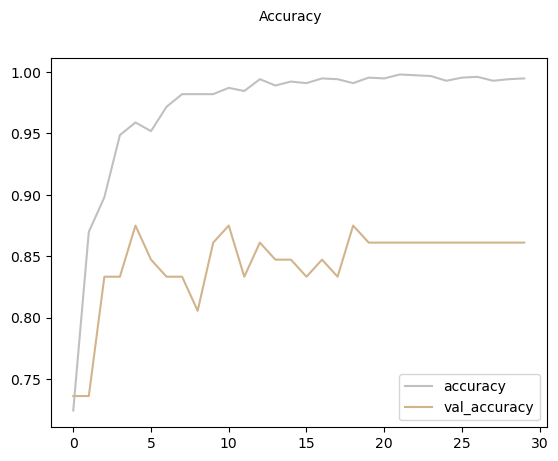

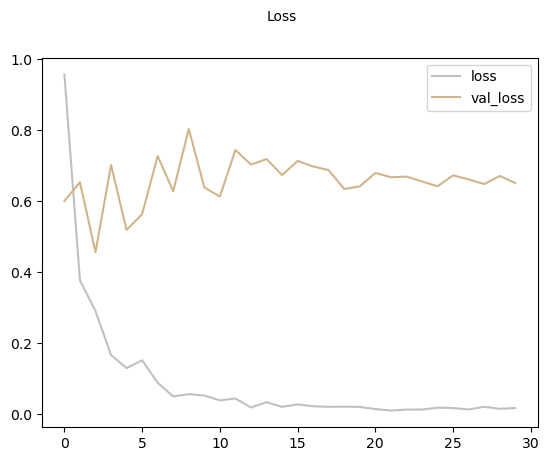

10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 332ms/step
              precision    recall  f1-score   support

           0     0.9485    0.7667    0.8479       120
           1     0.8519    0.9020    0.8762        51
           2     1.0000    0.9815    0.9907        54
           3     0.7658    0.9444    0.8458        90

    accuracy                         0.8762       315
   macro avg     0.8915    0.8986    0.8901       315
weighted avg     0.8895    0.8762    0.8764       315

The Cohen's Kappa Score is: 0.8293252198557912


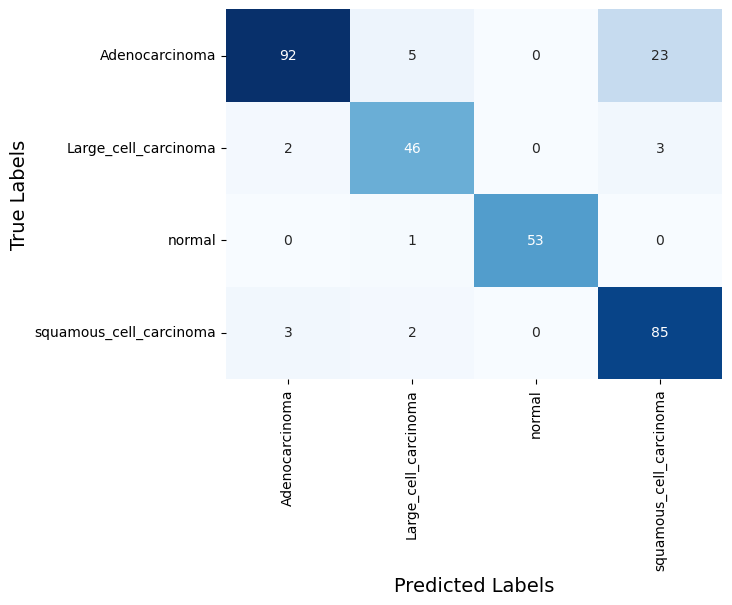

CPU times: total: 4min 10s
Wall time: 7min 3s


In [31]:
%%time

from tensorflow.keras.applications import EfficientNetV2B0

model_name = 'EfficientNetV2B0'
epoch_num = 30
batch = 16

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

x_train_smt = tf.image.resize(x_train_smt, (255, 255)).numpy()
x_val = tf.image.resize(x_val, (255, 255)).numpy()
x_test = tf.image.resize(x_test, (255, 255)).numpy()


def build_model_EfficientNetV2B0():
    base_model = EfficientNetV2B0(weights='imagenet', include_top=False, include_preprocessing=False)
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_EfficientNetV2B0 = build_model_EfficientNetV2B0()
model_EfficientNetV2B0.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-5)

history_EfficientNetV2B0 = model_EfficientNetV2B0.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_EfficientNetV2B0.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_EfficientNetV2B0.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_EfficientNetV2B0.history['loss'], color='silver', label='loss')
plt.plot(history_EfficientNetV2B0.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_EfficientNetV2B0.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

#### EfficientNetV2B1

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_1[0]… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, None,      │      2,304 │ block1a_project_… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, None,      │         64 │ block1b_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, None,      │          0 │ block1b_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, None,      │          0 │ block1b_project_… │
│ (Dropout)           │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, None,      │          0 │ block1b_drop[0][… │
│                     │ None, 16)         │            │ block1a_project_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1b_add[0][0] │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_

 Total params: 8,251,064 (31.48 MB)

 Trainable params: 1,899,572 (7.25 MB)

 Non-trainable params: 6,351,492 (24.23 MB)

Epoch 1/30
122/122 ━━━━━━━━━━━━━━━━━━━━ 46s 293ms/step - accuracy: 0.6536 - loss: 1.6784 - val_accuracy: 0.6667 - val_loss: 2.0444
Epoch 2/30
122/122 ━━━━━━━━━━━━━━━━━━━━ 35s 284ms/step - accuracy: 0.8909 - loss: 0.3840 - val_accuracy: 0.7083 - val_loss: 1.4282
Epoch 3/30
122/122 ━━━━━━━━━━━━━━━━━━━━ 35s 284ms/step - accuracy: 0.9033 - loss: 0.3462 - val_accuracy: 0.8194 - val_loss: 1.0251
Epoch 4/30
122/122 ━━━━━━━━━━━━━━━━━━━━ 35s 287ms/step - accuracy: 0.9330 - loss: 0.2365 - val_accuracy: 0.8194 - val_loss: 0.8363
Epoch 5/30
122/122 ━━━━━━━━━━━━━━━━━━━━ 35s 284ms/step - accuracy: 0.9504 - loss: 0.1736 - val_accuracy: 0.7917 - val_loss: 1.1917
Epoch 6/30
122/122 ━━━━━━━━━━━━━━━━━━━━ 36s 291ms/step - accuracy: 0.9563 - loss: 0.1417 - val_accuracy: 0.8194 - val_loss: 1.3434
Epoch 7/30
122/122 ━━━━━━━━━━━━━━━━━━━━ 36s 294ms/step - accuracy: 0.9697 - loss: 0.1121 - val_accuracy: 0.8194 - val_loss: 1.0852
Epoch 8/30
122/122 ━━━━━━━━━━━━━━━━━━━━ 36s 295ms/step - accuracy: 0.9654 - loss: 0

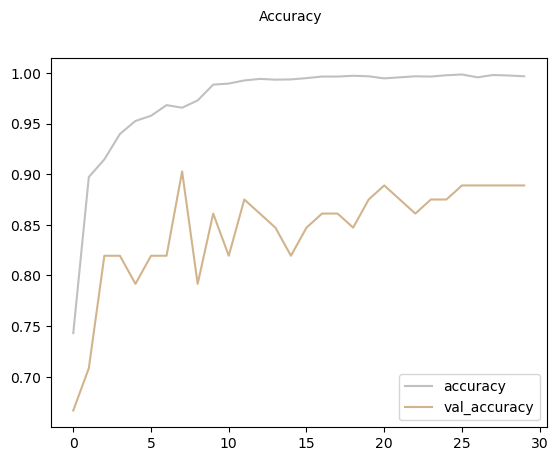

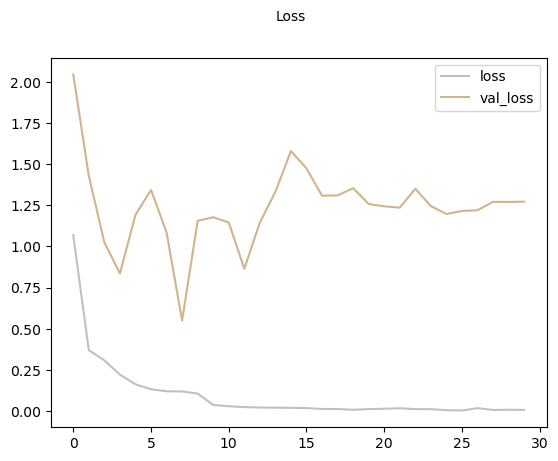

10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 410ms/step
              precision    recall  f1-score   support

           0     1.0000    0.5417    0.7027       120
           1     0.5795    1.0000    0.7338        51
           2     0.9815    0.9815    0.9815        54
           3     0.7685    0.9222    0.8384        90

    accuracy                         0.8000       315
   macro avg     0.8324    0.8613    0.8141       315
weighted avg     0.8626    0.8000    0.7943       315

The Cohen's Kappa Score is: 0.7329107279848185


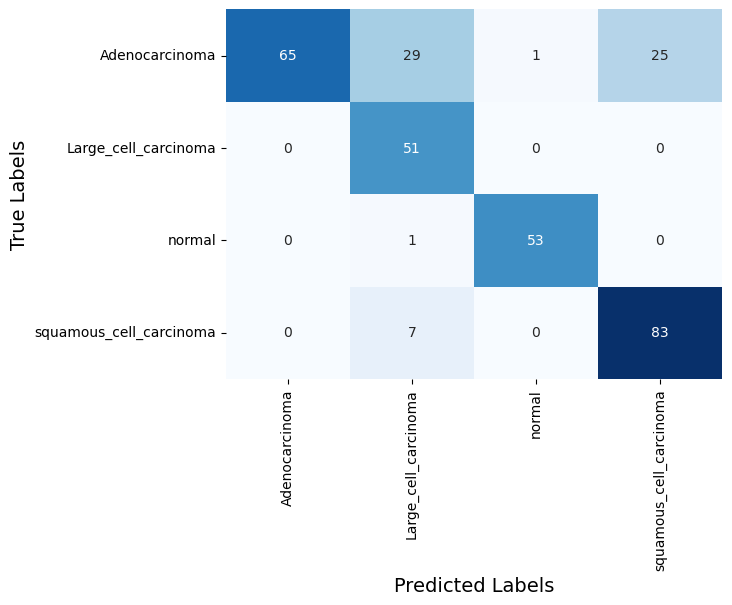

CPU times: total: 14min 2s
Wall time: 18min 27s


In [31]:
%%time

from tensorflow.keras.applications import EfficientNetV2B1

model_name = 'EfficientNetV2B1'
epoch_num = 30
batch = 32

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

x_train_smt = tf.image.resize(x_train_smt, (255, 255)).numpy()
x_val = tf.image.resize(x_val, (255, 255)).numpy()
x_test = tf.image.resize(x_test, (255, 255)).numpy()

def build_model_EfficientNetV2B1():
    base_model = EfficientNetV2B1(weights='imagenet', include_top=False, include_preprocessing=False)
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)

    initial_learning_rate = 1e-2
    lr_schedule = ExponentialDecay(
        initial_learning_rate, decay_steps=1000, decay_rate=0.3, staircase=True
    )
    optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
    
    model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_EfficientNetV2B1 = build_model_EfficientNetV2B1()
model_EfficientNetV2B1.summary()

#lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-3)

history_EfficientNetV2B1 = model_EfficientNetV2B1.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[tensorboard_callback])

fig = plt.figure()
plt.plot(history_EfficientNetV2B1.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_EfficientNetV2B1.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_EfficientNetV2B1.history['loss'], color='silver', label='loss')
plt.plot(history_EfficientNetV2B1.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_EfficientNetV2B1.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

Model: "functional_28"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_28      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_28[0… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, None,      │      2,304 │ block1a_project_… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, None,      │         64 │ block1b_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, None,      │          0 │ block1b_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, None,      │          0 │ block1b_project_… │
│ (Dropout)           │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, None,      │          0 │ block1b_drop[0][… │
│                     │ None, 16)         │            │ block1a_project_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1b_add[0][0] │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_

 Total params: 8,251,064 (31.48 MB)

 Trainable params: 1,899,572 (7.25 MB)

 Non-trainable params: 6,351,492 (24.23 MB)

Epoch 1/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 50s 820ms/step - accuracy: 0.6103 - loss: 1.4854 - val_accuracy: 0.6528 - val_loss: 0.7989 - learning_rate: 0.0010
Epoch 2/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 36s 740ms/step - accuracy: 0.8628 - loss: 0.4164 - val_accuracy: 0.8056 - val_loss: 0.6107 - learning_rate: 0.0010
Epoch 3/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 37s 764ms/step - accuracy: 0.9084 - loss: 0.2546 - val_accuracy: 0.6944 - val_loss: 0.6115 - learning_rate: 0.0010
Epoch 4/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 37s 747ms/step - accuracy: 0.9237 - loss: 0.2298 - val_accuracy: 0.8333 - val_loss: 0.5208 - learning_rate: 0.0010
Epoch 5/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 35s 715ms/step - accuracy: 0.9416 - loss: 0.1756 - val_accuracy: 0.7917 - val_loss: 0.6556 - learning_rate: 0.0010
Epoch 6/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 36s 726ms/step - accuracy: 0.9469 - loss: 0.1534 - val_accuracy: 0.8333 - val_loss: 0.6611 - learning_rate: 0.0010
Epoch 7/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 35s 709ms/step - accuracy: 0.9524 - loss: 0.

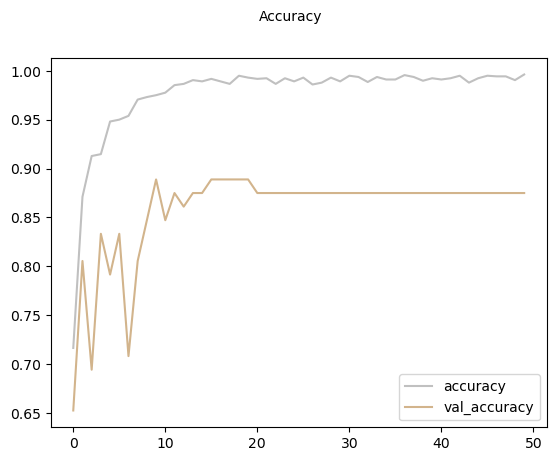

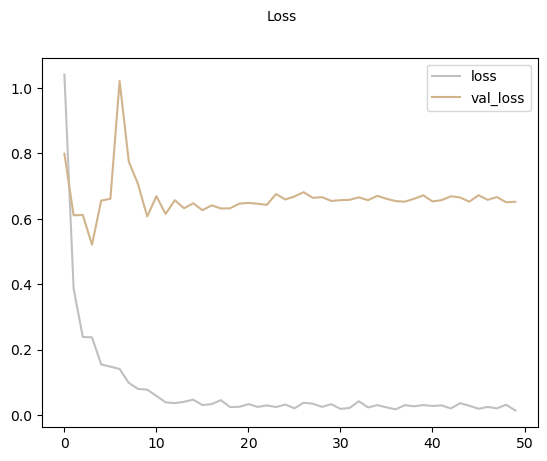

10/10 ━━━━━━━━━━━━━━━━━━━━ 9s 742ms/step
              precision    recall  f1-score   support

           0     1.0000    0.6333    0.7755       120
           1     0.7937    0.9804    0.8772        51
           2     0.9815    0.9815    0.9815        54
           3     0.7131    0.9667    0.8208        90

    accuracy                         0.8444       315
   macro avg     0.8721    0.8905    0.8637       315
weighted avg     0.8814    0.8444    0.8402       315

The Cohen's Kappa Score is: 0.7885500575373994


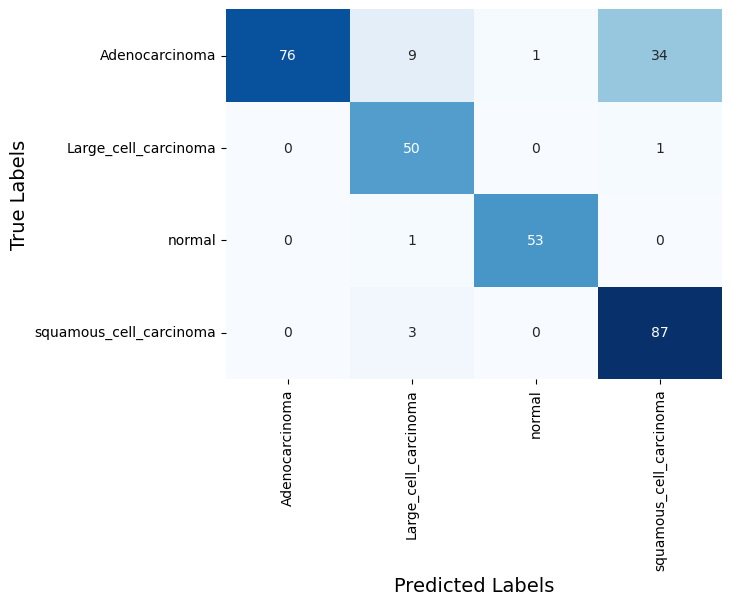

CPU times: total: 8min 23s
Wall time: 28min 54s


In [83]:
%%time

from tensorflow.keras.applications import EfficientNetV2B1

model_name = 'EfficientNetV2B1'
epoch_num = 50
batch = 32

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

x_train_smt = tf.image.resize(x_train_smt, (255, 255)).numpy()
x_val = tf.image.resize(x_val, (255, 255)).numpy()
x_test = tf.image.resize(x_test, (255, 255)).numpy()


def build_model_EfficientNetV2B1():
    base_model = EfficientNetV2B1(weights='imagenet', include_top=False, include_preprocessing=False)
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_EfficientNetV2B1 = build_model_EfficientNetV2B1()
model_EfficientNetV2B1.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-8)

history_EfficientNetV2B1 = model_EfficientNetV2B1.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_EfficientNetV2B1.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_EfficientNetV2B1.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_EfficientNetV2B1.history['loss'], color='silver', label='loss')
plt.plot(history_EfficientNetV2B1.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_EfficientNetV2B1.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

### EfficientNetV2B2

Model: "functional_26"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_26      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │        864 │ input_layer_26[0… │
│                     │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      4,608 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, None,      │      2,304 │ block1a_project_… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, None,      │         64 │ block1b_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, None,      │          0 │ block1b_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, None,      │          0 │ block1b_project_… │
│ (Dropout)           │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, None,      │          0 │ block1b_drop[0][… │
│                     │ None, 16)         │            │ block1a_project_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1b_add[0][0] │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ None, 32)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        128 │ block2a_project_

 Total params: 10,220,386 (38.99 MB)

 Trainable params: 2,135,736 (8.15 MB)

 Non-trainable params: 8,084,650 (30.84 MB)

Epoch 1/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 50s 816ms/step - accuracy: 0.5961 - loss: 1.4752 - val_accuracy: 0.7222 - val_loss: 0.7462 - learning_rate: 0.0010
Epoch 2/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 36s 740ms/step - accuracy: 0.8614 - loss: 0.4588 - val_accuracy: 0.7778 - val_loss: 0.5993 - learning_rate: 0.0010
Epoch 3/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 36s 729ms/step - accuracy: 0.9012 - loss: 0.2844 - val_accuracy: 0.8611 - val_loss: 0.4382 - learning_rate: 0.0010
Epoch 4/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 36s 738ms/step - accuracy: 0.9158 - loss: 0.2262 - val_accuracy: 0.8472 - val_loss: 0.5106 - learning_rate: 0.0010
Epoch 5/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 36s 733ms/step - accuracy: 0.9365 - loss: 0.1941 - val_accuracy: 0.8056 - val_loss: 0.6238 - learning_rate: 0.0010
Epoch 6/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 36s 730ms/step - accuracy: 0.9478 - loss: 0.1816 - val_accuracy: 0.8333 - val_loss: 0.6531 - learning_rate: 0.0010
Epoch 7/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 36s 742ms/step - accuracy: 0.9492 - loss: 0.

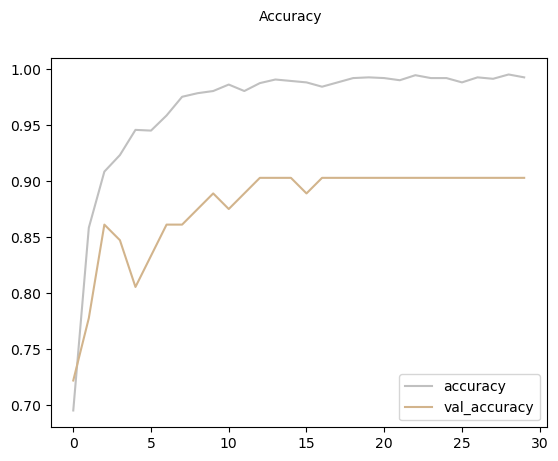

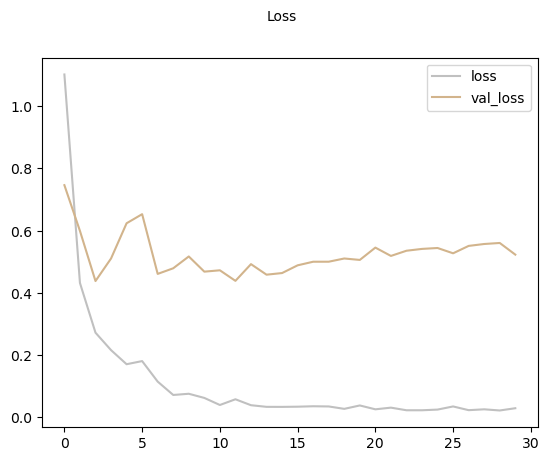

10/10 ━━━━━━━━━━━━━━━━━━━━ 9s 788ms/step
              precision    recall  f1-score   support

           0     0.9767    0.7000    0.8155       120
           1     0.7969    1.0000    0.8870        51
           2     1.0000    0.9815    0.9907        54
           3     0.7500    0.9333    0.8317        90

    accuracy                         0.8635       315
   macro avg     0.8809    0.9037    0.8812       315
weighted avg     0.8868    0.8635    0.8617       315

The Cohen's Kappa Score is: 0.8136838195848636


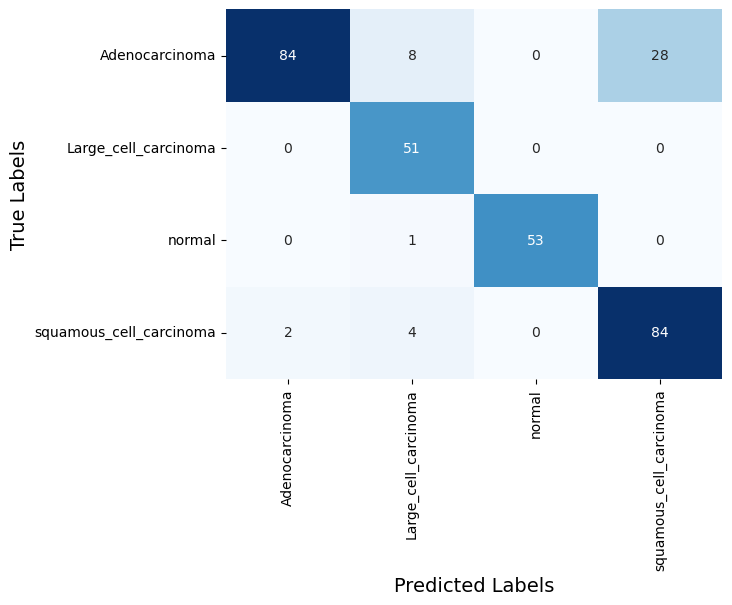

CPU times: total: 5min 35s
Wall time: 18min 23s


In [68]:
%%time

from tensorflow.keras.applications import EfficientNetV2B2

model_name = 'EfficientNetV2B2'
epoch_num = 30
batch = 32

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

x_train_smt = tf.image.resize(x_train_smt, (255, 255)).numpy()
x_val = tf.image.resize(x_val, (255, 255)).numpy()
x_test = tf.image.resize(x_test, (255, 255)).numpy()

def build_model_EfficientNetV2B2():
    base_model = EfficientNetV2B2(weights='imagenet', include_top=False, include_preprocessing=False)
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_EfficientNetV2B2 = build_model_EfficientNetV2B2()
model_EfficientNetV2B2.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-8)

history_EfficientNetV2B2 = model_EfficientNetV2B2.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_EfficientNetV2B2.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_EfficientNetV2B2.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_EfficientNetV2B2.history['loss'], color='silver', label='loss')
plt.plot(history_EfficientNetV2B2.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_EfficientNetV2B2.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

### EfficientNetV2B3

Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_16      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │      1,080 │ input_layer_16[0… │
│                     │ None, 40)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        160 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 40)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 40)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      5,760 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, None,      │      2,304 │ block1a_project_… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, None,      │         64 │ block1b_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, None,      │          0 │ block1b_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, None,      │          0 │ block1b_project_… │
│ (Dropout)           │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, None,      │          0 │ block1b_drop[0][… │
│                     │ None, 16)         │            │ block1a_project_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1b_add[0][0] │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,560 │ block2a_expand_a… │
│ (Conv2D)            │ None, 40)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        160 │ block2a_project_

 Total params: 14,512,706 (55.36 MB)

 Trainable params: 2,425,790 (9.25 MB)

 Non-trainable params: 12,086,916 (46.11 MB)

Epoch 1/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 57s 470ms/step - accuracy: 0.5886 - loss: 1.6296 - val_accuracy: 0.7639 - val_loss: 0.6318 - learning_rate: 0.0010
Epoch 2/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 43s 443ms/step - accuracy: 0.8193 - loss: 0.6332 - val_accuracy: 0.8056 - val_loss: 0.5293 - learning_rate: 0.0010
Epoch 3/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 43s 442ms/step - accuracy: 0.8621 - loss: 0.4402 - val_accuracy: 0.7778 - val_loss: 0.6267 - learning_rate: 0.0010
Epoch 4/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 44s 453ms/step - accuracy: 0.8972 - loss: 0.3180 - val_accuracy: 0.8056 - val_loss: 0.5619 - learning_rate: 0.0010
Epoch 5/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 44s 445ms/step - accuracy: 0.9082 - loss: 0.2644 - val_accuracy: 0.8750 - val_loss: 0.5462 - learning_rate: 0.0010
Epoch 6/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 43s 438ms/step - accuracy: 0.9319 - loss: 0.1600 - val_accuracy: 0.8194 - val_loss: 0.4713 - learning_rate: 5.0000e-04
Epoch 7/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 42s 433ms/step - accuracy: 0.9642 - loss

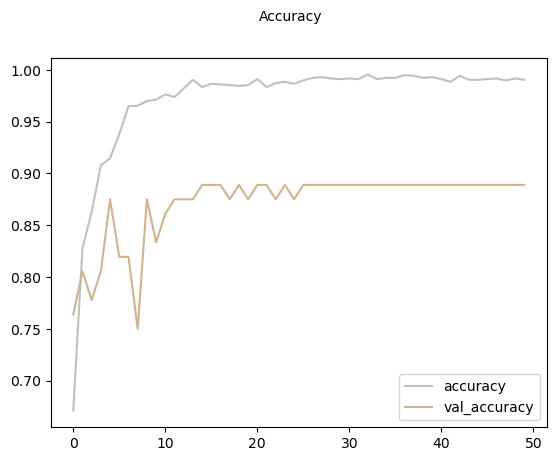

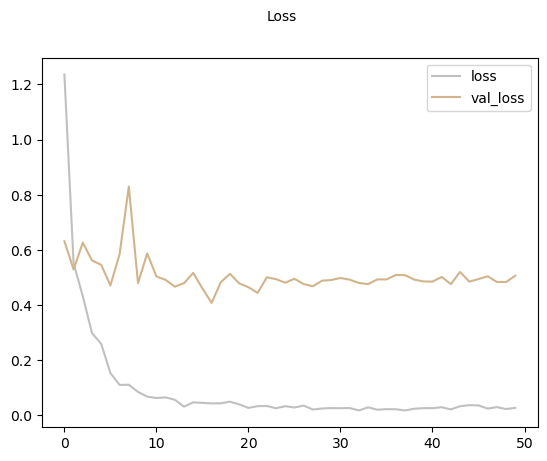

10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 832ms/step
              precision    recall  f1-score   support

           0     0.9429    0.8250    0.8800       120
           1     0.7778    0.9608    0.8596        51
           2     0.9808    0.9444    0.9623        54
           3     0.8316    0.8778    0.8541        90

    accuracy                         0.8825       315
   macro avg     0.8832    0.9020    0.8890       315
weighted avg     0.8908    0.8825    0.8834       315

The Cohen's Kappa Score is: 0.8382463152635523


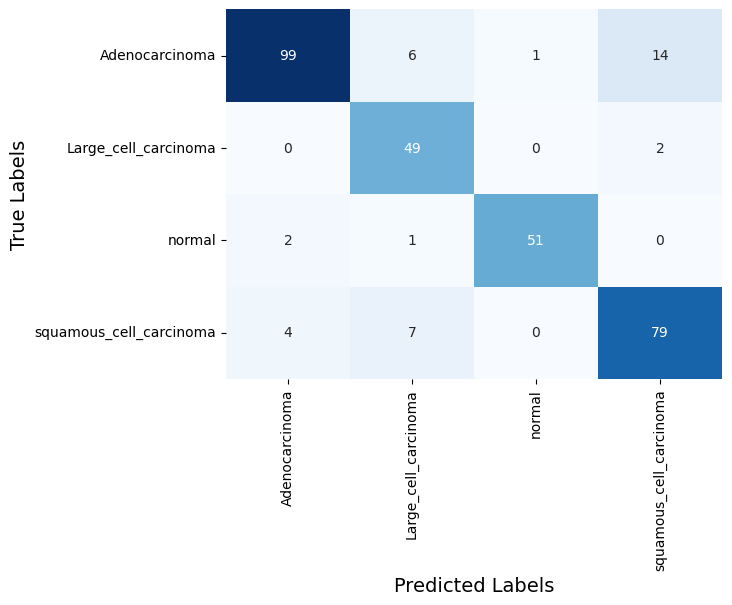

CPU times: total: 14min 7s
Wall time: 37min 19s


In [55]:
%%time

from tensorflow.keras.applications import EfficientNetV2B3

model_name = 'EfficientNetV2B3'
epoch_num = 50
batch = 16

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

x_train_smt = tf.image.resize(x_train_smt, (255, 255)).numpy()
x_val = tf.image.resize(x_val, (255, 255)).numpy()
x_test = tf.image.resize(x_test, (255, 255)).numpy()

def build_model_EfficientNetV2B3():
    base_model = EfficientNetV2B3(weights='imagenet', include_top=False, include_preprocessing=False)
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_EfficientNetV2B3 = build_model_EfficientNetV2B3()
model_EfficientNetV2B3.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-8)

history_EfficientNetV2B3 = model_EfficientNetV2B3.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_EfficientNetV2B3.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_EfficientNetV2B3.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_EfficientNetV2B3.history['loss'], color='silver', label='loss')
plt.plot(history_EfficientNetV2B3.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_EfficientNetV2B3.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_20      │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 3)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, None,      │      1,080 │ input_layer_20[0… │
│                     │ None, 40)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, None,      │        160 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ None, 40)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, None,      │          0 │ stem_bn[0][0]     │
│ (Activation)        │ None, 40)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, None,      │      5,760 │ stem_activation[… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, None,      │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, None,      │          0 │ block1a_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, None,      │      2,304 │ block1a_project_… │
│ (Conv2D)            │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, None,      │         64 │ block1b_project_… │
│ (BatchNormalizatio… │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, None,      │          0 │ block1b_project_… │
│ (Activation)        │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, None,      │          0 │ block1b_project_… │
│ (Dropout)           │ None, 16)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, None,      │          0 │ block1b_drop[0][… │
│                     │ None, 16)         │            │ block1a_project_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, None,      │      9,216 │ block1b_add[0][0] │
│ (Conv2D)            │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, None,      │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, None,      │          0 │ block2a_expand_b… │
│ (Activation)        │ None, 64)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, None,      │      2,560 │ block2a_expand_a… │
│ (Conv2D)            │ None, 40)         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, None,      │        160 │ block2a_project_

 Total params: 14,512,706 (55.36 MB)

 Trainable params: 2,425,790 (9.25 MB)

 Non-trainable params: 12,086,916 (46.11 MB)

Epoch 1/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 57s 928ms/step - accuracy: 0.5953 - loss: 1.5035 - val_accuracy: 0.7083 - val_loss: 0.6841 - learning_rate: 0.0010
Epoch 2/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 42s 853ms/step - accuracy: 0.8268 - loss: 0.5439 - val_accuracy: 0.8056 - val_loss: 0.5976 - learning_rate: 0.0010
Epoch 3/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 41s 831ms/step - accuracy: 0.8868 - loss: 0.3532 - val_accuracy: 0.8611 - val_loss: 0.5600 - learning_rate: 0.0010
Epoch 4/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 42s 857ms/step - accuracy: 0.9082 - loss: 0.2963 - val_accuracy: 0.7639 - val_loss: 0.6741 - learning_rate: 0.0010
Epoch 5/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 42s 858ms/step - accuracy: 0.9458 - loss: 0.1595 - val_accuracy: 0.7222 - val_loss: 0.6708 - learning_rate: 0.0010
Epoch 6/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 43s 868ms/step - accuracy: 0.9494 - loss: 0.1426 - val_accuracy: 0.8333 - val_loss: 0.5615 - learning_rate: 0.0010
Epoch 7/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 41s 845ms/step - accuracy: 0.9574 - loss: 0.

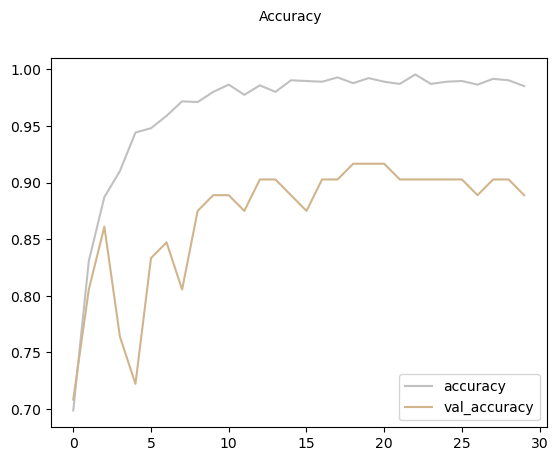

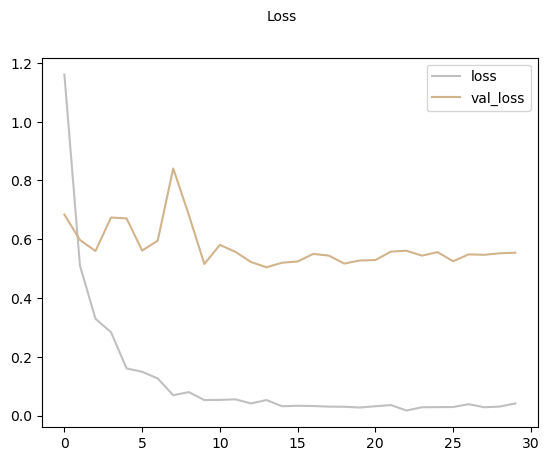

10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 917ms/step
              precision    recall  f1-score   support

           0     0.9126    0.7833    0.8430       120
           1     0.7083    1.0000    0.8293        51
           2     0.9815    0.9815    0.9815        54
           3     0.8256    0.7889    0.8068        90

    accuracy                         0.8540       315
   macro avg     0.8570    0.8884    0.8652       315
weighted avg     0.8665    0.8540    0.8542       315

The Cohen's Kappa Score is: 0.8002398775797179


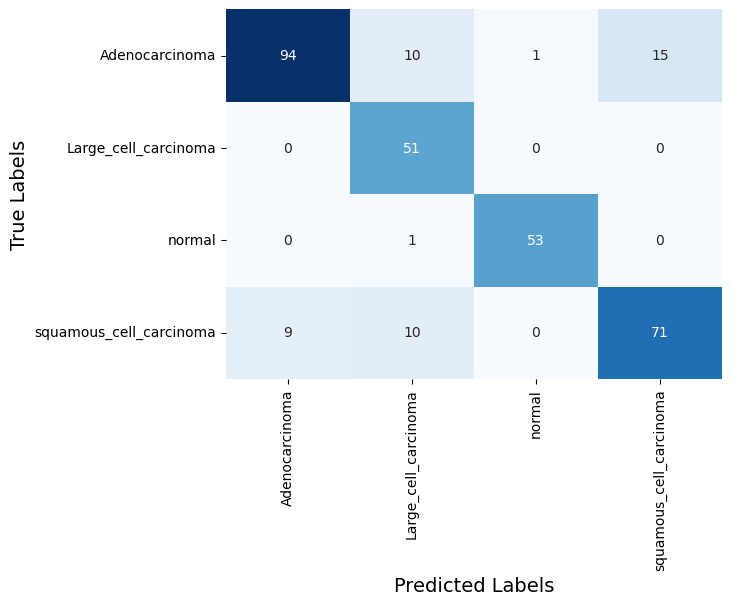

CPU times: total: 11min 33s
Wall time: 21min 34s


In [62]:
%%time

from tensorflow.keras.applications import EfficientNetV2B3

model_name = 'EfficientNetV2B3'
epoch_num = 30
batch = 32

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

x_train_smt = tf.image.resize(x_train_smt, (255, 255)).numpy()
x_val = tf.image.resize(x_val, (255, 255)).numpy()
x_test = tf.image.resize(x_test, (255, 255)).numpy()

def build_model_EfficientNetV2B3():
    base_model = EfficientNetV2B3(weights='imagenet', include_top=False, include_preprocessing=False)
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_EfficientNetV2B3 = build_model_EfficientNetV2B3()
model_EfficientNetV2B3.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-8)

history_EfficientNetV2B3 = model_EfficientNetV2B3.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_EfficientNetV2B3.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_EfficientNetV2B3.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_EfficientNetV2B3.history['loss'], color='silver', label='loss')
plt.plot(history_EfficientNetV2B3.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_EfficientNetV2B3.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

### DenseNet variations

#### DenseNet 121

Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_17      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_14   │ (None, 230, 230,  │          0 │ input_layer_17[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_1… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_15   │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 8,095,300 (30.88 MB)

 Trainable params: 1,223,876 (4.67 MB)

 Non-trainable params: 6,871,424 (26.21 MB)

Epoch 1/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 69s 552ms/step - accuracy: 0.6731 - loss: 1.0040 - val_accuracy: 0.6806 - val_loss: 1.2146 - learning_rate: 0.0010
Epoch 2/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 52s 527ms/step - accuracy: 0.9405 - loss: 0.1904 - val_accuracy: 0.7639 - val_loss: 0.7045 - learning_rate: 0.0010
Epoch 3/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 52s 529ms/step - accuracy: 0.9658 - loss: 0.1047 - val_accuracy: 0.7222 - val_loss: 1.1684 - learning_rate: 0.0010
Epoch 4/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 51s 523ms/step - accuracy: 0.9843 - loss: 0.0472 - val_accuracy: 0.8056 - val_loss: 0.9021 - learning_rate: 0.0010
Epoch 5/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 51s 519ms/step - accuracy: 0.9943 - loss: 0.0203 - val_accuracy: 0.8472 - val_loss: 0.7562 - learning_rate: 0.0010
Epoch 6/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 53s 538ms/step - accuracy: 0.9951 - loss: 0.0202 - val_accuracy: 0.8472 - val_loss: 0.8563 - learning_rate: 5.0000e-04
Epoch 7/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 51s 520ms/step - accuracy: 1.0000 - loss

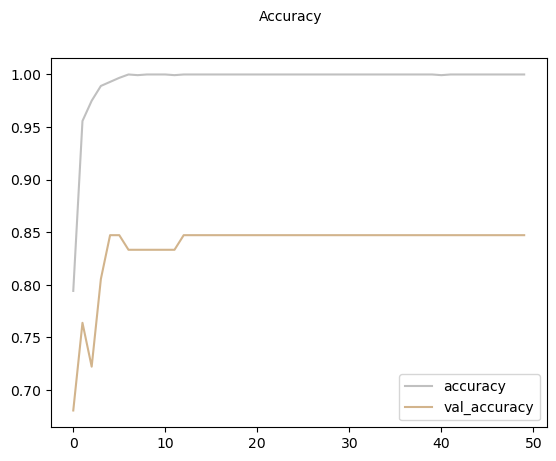

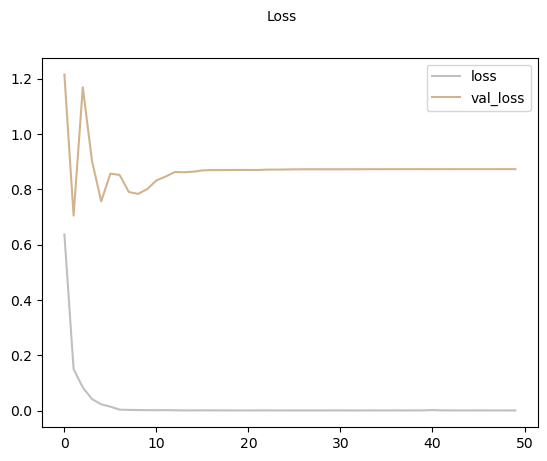

10/10 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step 
              precision    recall  f1-score   support

           0     0.8496    0.8000    0.8240       120
           1     0.6912    0.9216    0.7899        51
           2     1.0000    0.9815    0.9907        54
           3     0.9136    0.8222    0.8655        90

    accuracy                         0.8571       315
   macro avg     0.8636    0.8813    0.8675       315
weighted avg     0.8680    0.8571    0.8589       315

The Cohen's Kappa Score is: 0.8032479700187383


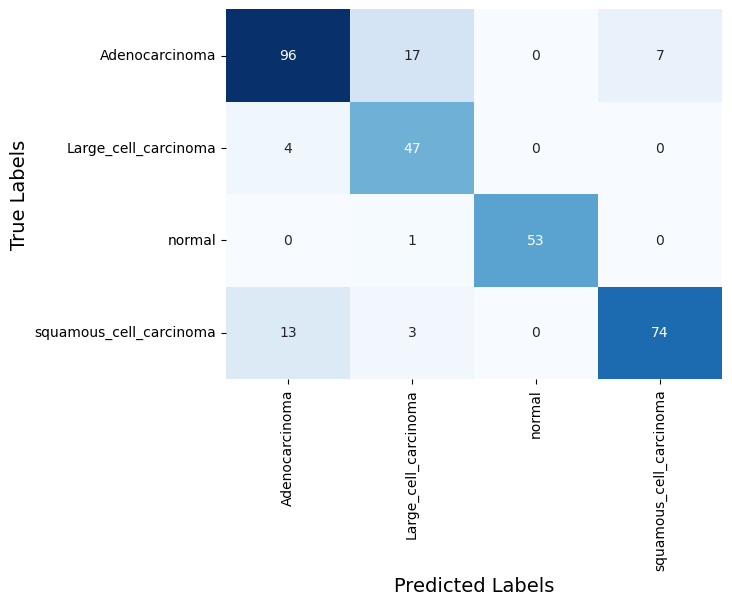

CPU times: total: 13min 24s
Wall time: 43min 25s


In [56]:
%%time
from tensorflow.keras.applications import DenseNet121

model_name = 'densenet121'
epoch_num = 50
batch = 16

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

x_train_smt = tf.image.resize(x_train_smt, (224, 224)).numpy()
x_val = tf.image.resize(x_val, (224, 224)).numpy()
x_test = tf.image.resize(x_test, (224, 224)).numpy()


def build_model_DenseNet121():
    base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_DenseNet121 = build_model_DenseNet121()
model_DenseNet121.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7)

history_DenseNet121 = model_DenseNet121.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_DenseNet121.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_DenseNet121.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_DenseNet121.history['loss'], color='silver', label='loss')
plt.plot(history_DenseNet121.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_DenseNet121.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_21      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_18   │ (None, 230, 230,  │          0 │ input_layer_21[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_1… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_19   │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 8,095,300 (30.88 MB)

 Trainable params: 1,223,876 (4.67 MB)

 Non-trainable params: 6,871,424 (26.21 MB)

Epoch 1/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.6713 - loss: 0.8839 - val_accuracy: 0.7083 - val_loss: 0.7010 - learning_rate: 0.0010
Epoch 2/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 48s 982ms/step - accuracy: 0.9490 - loss: 0.1531 - val_accuracy: 0.7361 - val_loss: 0.7669 - learning_rate: 0.0010
Epoch 3/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 48s 981ms/step - accuracy: 0.9839 - loss: 0.0481 - val_accuracy: 0.7500 - val_loss: 0.7705 - learning_rate: 0.0010
Epoch 4/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 48s 982ms/step - accuracy: 0.9952 - loss: 0.0265 - val_accuracy: 0.8056 - val_loss: 0.7126 - learning_rate: 0.0010
Epoch 5/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 48s 987ms/step - accuracy: 0.9993 - loss: 0.0137 - val_accuracy: 0.8611 - val_loss: 0.6755 - learning_rate: 5.0000e-04
Epoch 6/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 48s 983ms/step - accuracy: 0.9978 - loss: 0.0112 - val_accuracy: 0.8333 - val_loss: 0.7652 - learning_rate: 5.0000e-04
Epoch 7/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 48s 983ms/step - accuracy: 1.0000 - los

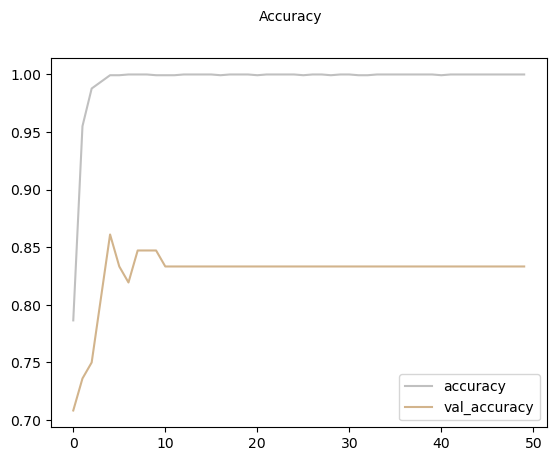

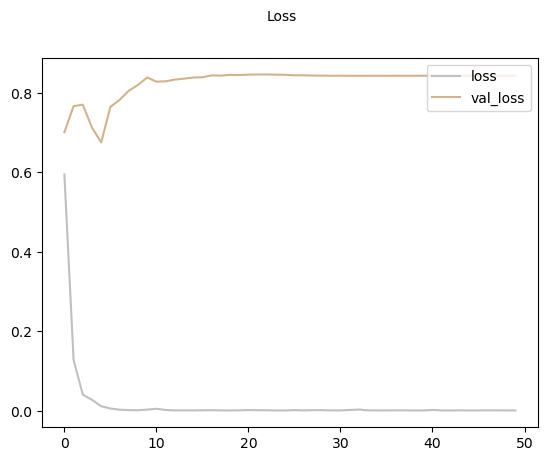

10/10 ━━━━━━━━━━━━━━━━━━━━ 13s 1s/step 
              precision    recall  f1-score   support

           0     0.9278    0.7500    0.8295       120
           1     0.7101    0.9608    0.8167        51
           2     1.0000    0.9815    0.9907        54
           3     0.8854    0.9444    0.9140        90

    accuracy                         0.8794       315
   macro avg     0.8808    0.9092    0.8877       315
weighted avg     0.8928    0.8794    0.8792       315

The Cohen's Kappa Score is: 0.8350421696709112


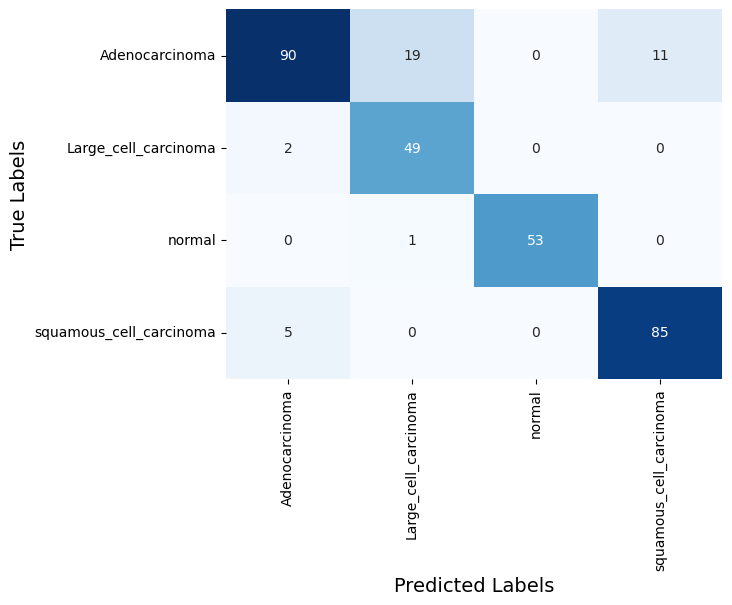

CPU times: total: 13min 57s
Wall time: 42min 17s


In [63]:
%%time
from tensorflow.keras.applications import DenseNet121

model_name = 'densenet121'
epoch_num = 50
batch = 32

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

x_train_smt = tf.image.resize(x_train_smt, (224, 224)).numpy()
x_val = tf.image.resize(x_val, (224, 224)).numpy()
x_test = tf.image.resize(x_test, (224, 224)).numpy()


def build_model_DenseNet121():
    base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_DenseNet121 = build_model_DenseNet121()
model_DenseNet121.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7)

history_DenseNet121 = model_DenseNet121.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_DenseNet121.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_DenseNet121.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_DenseNet121.history['loss'], color='silver', label='loss')
plt.plot(history_DenseNet121.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_DenseNet121.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

#### DenseNet 169

Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_18      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_16   │ (None, 230, 230,  │          0 │ input_layer_18[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_1… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_17   │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 14,356,036 (54.76 MB)

 Trainable params: 1,963,716 (7.49 MB)

 Non-trainable params: 12,392,320 (47.27 MB)

Epoch 1/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 78s 688ms/step - accuracy: 0.7058 - loss: 0.9423 - val_accuracy: 0.7361 - val_loss: 0.8356 - learning_rate: 0.0010
Epoch 2/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 66s 670ms/step - accuracy: 0.9392 - loss: 0.1775 - val_accuracy: 0.8194 - val_loss: 0.8118 - learning_rate: 0.0010
Epoch 3/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 65s 662ms/step - accuracy: 0.9650 - loss: 0.0970 - val_accuracy: 0.8472 - val_loss: 0.7502 - learning_rate: 0.0010
Epoch 4/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 66s 669ms/step - accuracy: 0.9948 - loss: 0.0353 - val_accuracy: 0.8194 - val_loss: 0.9876 - learning_rate: 0.0010
Epoch 5/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 65s 668ms/step - accuracy: 0.9914 - loss: 0.0325 - val_accuracy: 0.8056 - val_loss: 1.1681 - learning_rate: 0.0010
Epoch 6/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 67s 683ms/step - accuracy: 0.9913 - loss: 0.0289 - val_accuracy: 0.7917 - val_loss: 1.4253 - learning_rate: 0.0010
Epoch 7/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 66s 669ms/step - accuracy: 0.9911 - loss: 0.

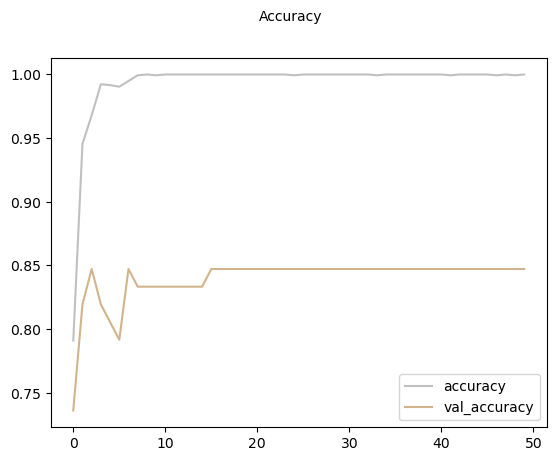

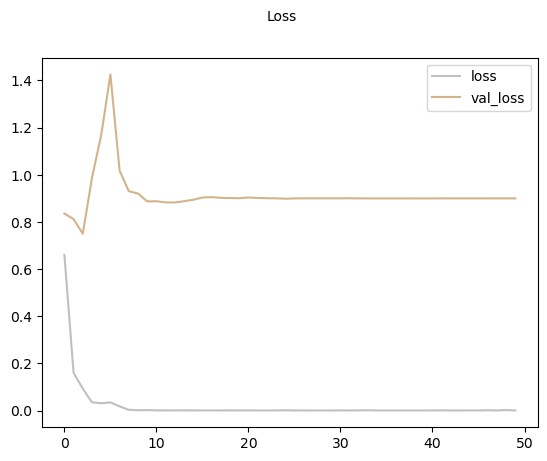

10/10 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step
              precision    recall  f1-score   support

           0     0.9059    0.6417    0.7512       120
           1     0.5814    0.9804    0.7299        51
           2     0.9464    0.9815    0.9636        54
           3     0.8295    0.8111    0.8202        90

    accuracy                         0.8032       315
   macro avg     0.8158    0.8537    0.8163       315
weighted avg     0.8385    0.8032    0.8039       315

The Cohen's Kappa Score is: 0.7349888052106657


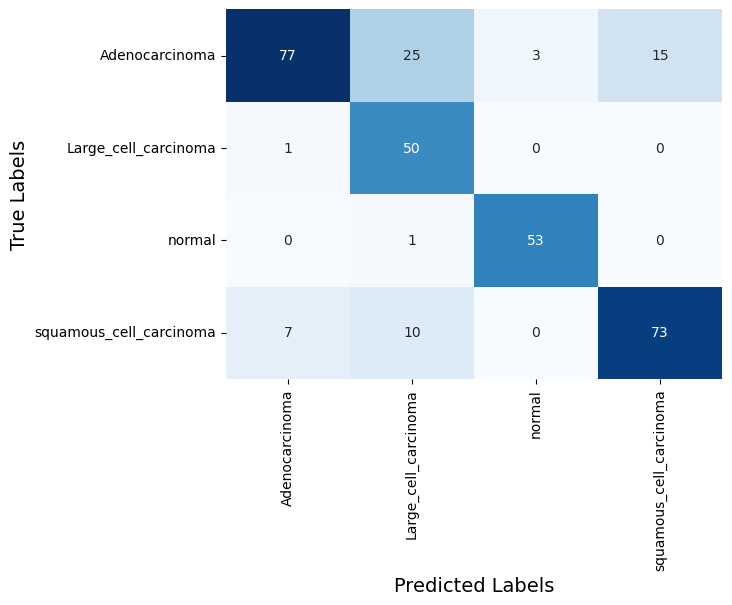

CPU times: total: 16min 12s
Wall time: 55min 21s


In [57]:
%%time

model_name = 'densenet169'
epoch_num = 50
batch = 16

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

x_train_smt = tf.image.resize(x_train_smt, (224, 224)).numpy()
x_val = tf.image.resize(x_val, (224, 224)).numpy()
x_test = tf.image.resize(x_test, (224, 224)).numpy()


def build_model_DenseNet169():
    base_model = DenseNet169(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_DenseNet169 = build_model_DenseNet169()
model_DenseNet169.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7)

history_DenseNet169 = model_DenseNet169.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_DenseNet169.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_DenseNet169.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_DenseNet169.history['loss'], color='silver', label='loss')
plt.plot(history_DenseNet169.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_DenseNet169.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_22      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_20   │ (None, 230, 230,  │          0 │ input_layer_22[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_21   │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_2… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 14,356,036 (54.76 MB)

 Trainable params: 1,963,716 (7.49 MB)

 Non-trainable params: 12,392,320 (47.27 MB)

Epoch 1/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 69s 1s/step - accuracy: 0.7099 - loss: 0.8821 - val_accuracy: 0.6528 - val_loss: 1.2042 - learning_rate: 0.0010
Epoch 2/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 54s 1s/step - accuracy: 0.9440 - loss: 0.1645 - val_accuracy: 0.8056 - val_loss: 0.7063 - learning_rate: 0.0010
Epoch 3/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - accuracy: 0.9847 - loss: 0.0541 - val_accuracy: 0.7917 - val_loss: 0.8295 - learning_rate: 0.0010
Epoch 4/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 54s 1s/step - accuracy: 0.9949 - loss: 0.0266 - val_accuracy: 0.8333 - val_loss: 0.7813 - learning_rate: 0.0010
Epoch 5/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 54s 1s/step - accuracy: 0.9984 - loss: 0.0151 - val_accuracy: 0.7778 - val_loss: 1.0069 - learning_rate: 0.0010
Epoch 6/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 54s 1s/step - accuracy: 1.0000 - loss: 0.0040 - val_accuracy: 0.8333 - val_loss: 0.9033 - learning_rate: 5.0000e-04
Epoch 7/30
49/49 ━━━━━━━━━━━━━━━━━━━━ 54s 1s/step - accuracy: 0.9996 - loss: 0.0026 - val_accura

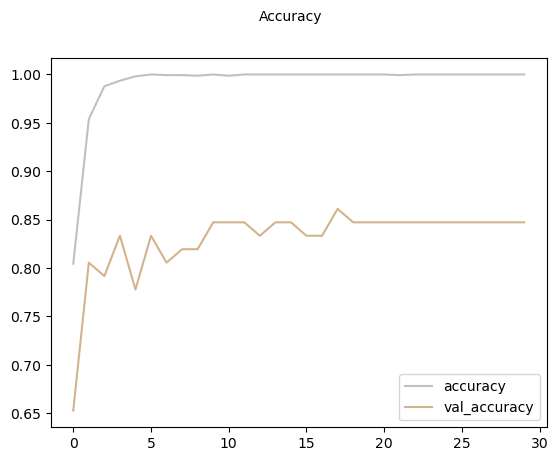

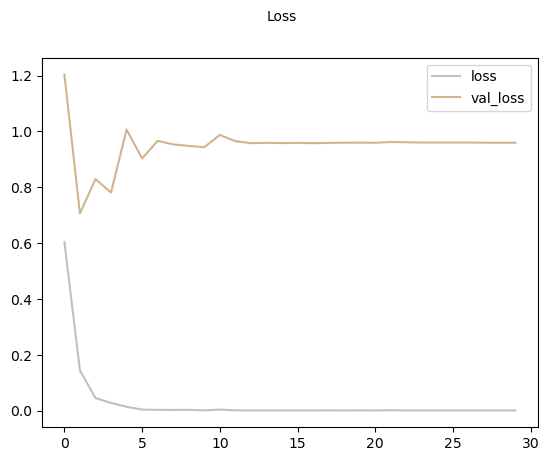

10/10 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step
              precision    recall  f1-score   support

           0     0.8936    0.7000    0.7850       120
           1     0.6203    0.9608    0.7538        51
           2     1.0000    0.9815    0.9907        54
           3     0.8427    0.8333    0.8380        90

    accuracy                         0.8286       315
   macro avg     0.8391    0.8689    0.8419       315
weighted avg     0.8530    0.8286    0.8304       315

The Cohen's Kappa Score is: 0.7671266633809759


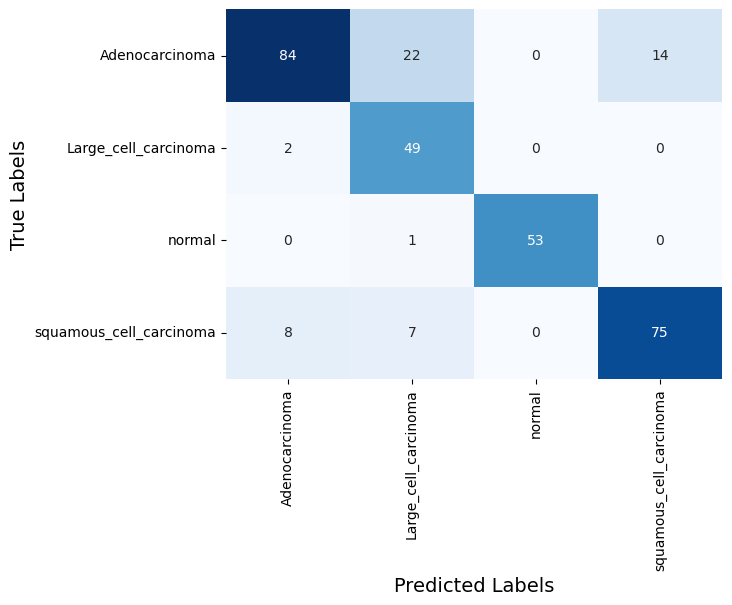

CPU times: total: 10min 16s
Wall time: 28min 31s


In [64]:
%%time

model_name = 'densenet169'
epoch_num = 30
batch = 32

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

x_train_smt = tf.image.resize(x_train_smt, (224, 224)).numpy()
x_val = tf.image.resize(x_val, (224, 224)).numpy()
x_test = tf.image.resize(x_test, (224, 224)).numpy()


def build_model_DenseNet169():
    base_model = DenseNet169(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_DenseNet169 = build_model_DenseNet169()
model_DenseNet169.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7)

history_DenseNet169 = model_DenseNet169.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_DenseNet169.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_DenseNet169.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_DenseNet169.history['loss'], color='silver', label='loss')
plt.plot(history_DenseNet169.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_DenseNet169.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

Model: "functional_23"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_23      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_22   │ (None, 230, 230,  │          0 │ input_layer_23[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_23   │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_2… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 14,356,036 (54.76 MB)

 Trainable params: 1,963,716 (7.49 MB)

 Non-trainable params: 12,392,320 (47.27 MB)

Epoch 1/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.6899 - loss: 0.9503 - val_accuracy: 0.7361 - val_loss: 0.8714 - learning_rate: 0.0010
Epoch 2/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.9571 - loss: 0.1486 - val_accuracy: 0.7639 - val_loss: 0.7936 - learning_rate: 0.0010
Epoch 3/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.9835 - loss: 0.0584 - val_accuracy: 0.8056 - val_loss: 0.9193 - learning_rate: 0.0010
Epoch 4/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.9959 - loss: 0.0232 - val_accuracy: 0.8333 - val_loss: 0.8421 - learning_rate: 0.0010
Epoch 5/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.9968 - loss: 0.0102 - val_accuracy: 0.8472 - val_loss: 0.6369 - learning_rate: 0.0010
Epoch 6/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 58s 1s/step - accuracy: 0.9948 - loss: 0.0185 - val_accuracy: 0.8194 - val_loss: 0.8232 - learning_rate: 0.0010
Epoch 7/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 57s 1s/step - accuracy: 0.9953 - loss: 0.0155 - val_accuracy: 

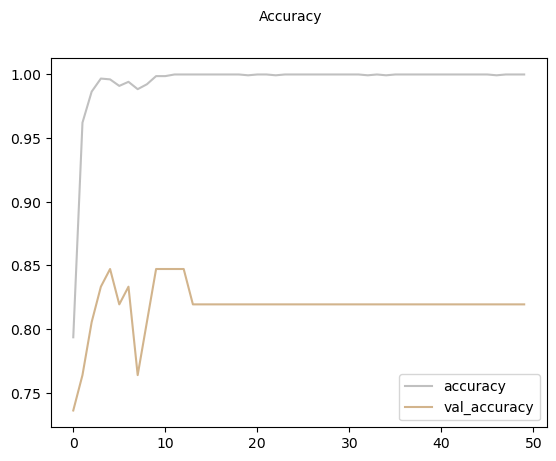

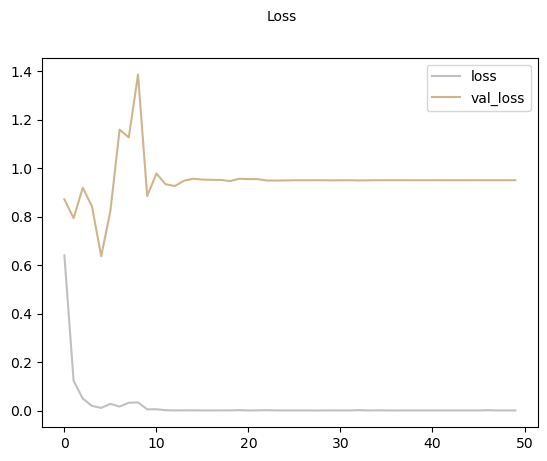

10/10 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step
              precision    recall  f1-score   support

           0     0.8736    0.6333    0.7343       120
           1     0.5484    1.0000    0.7083        51
           2     0.9636    0.9815    0.9725        54
           3     0.8500    0.7556    0.8000        90

    accuracy                         0.7873       315
   macro avg     0.8089    0.8426    0.8038       315
weighted avg     0.8296    0.7873    0.7897       315

The Cohen's Kappa Score is: 0.714303118908382


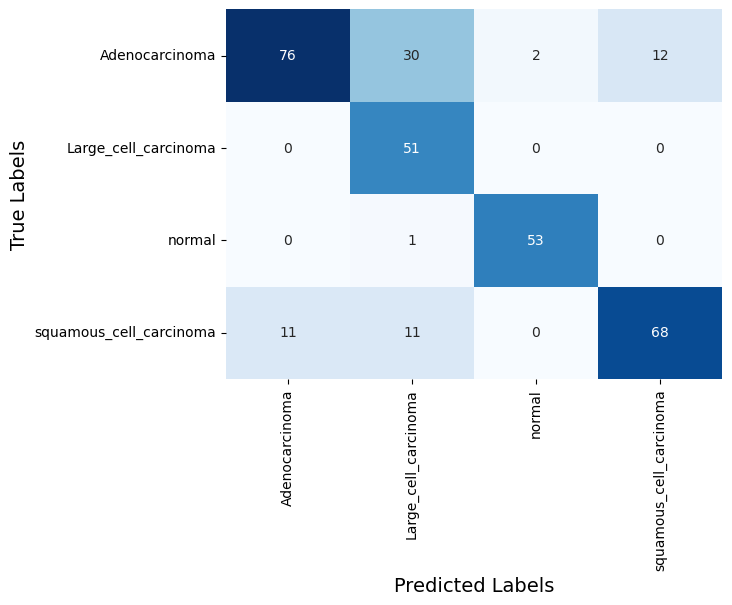

CPU times: total: 17min 24s
Wall time: 48min 31s


In [65]:
%%time

model_name = 'densenet169'
epoch_num = 50
batch = 32

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

x_train_smt = tf.image.resize(x_train_smt, (224, 224)).numpy()
x_val = tf.image.resize(x_val, (224, 224)).numpy()
x_test = tf.image.resize(x_test, (224, 224)).numpy()


def build_model_DenseNet169():
    base_model = DenseNet169(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_DenseNet169 = build_model_DenseNet169()
model_DenseNet169.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7)

history_DenseNet169 = model_DenseNet169.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_DenseNet169.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_DenseNet169.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_DenseNet169.history['loss'], color='silver', label='loss')
plt.plot(history_DenseNet169.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_DenseNet169.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

#### DenseNet 201

Model: "functional_24"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_24      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_24   │ (None, 230, 230,  │          0 │ input_layer_24[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_25   │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_2… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 20,297,284 (77.43 MB)

 Trainable params: 2,259,652 (8.62 MB)

 Non-trainable params: 18,037,632 (68.81 MB)

Epoch 1/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 129s 1s/step - accuracy: 0.6933 - loss: 0.9561 - val_accuracy: 0.7222 - val_loss: 0.8084 - learning_rate: 0.0010
Epoch 2/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 107s 1s/step - accuracy: 0.9340 - loss: 0.1892 - val_accuracy: 0.7222 - val_loss: 1.0440 - learning_rate: 0.0010
Epoch 3/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 105s 1s/step - accuracy: 0.9733 - loss: 0.0748 - val_accuracy: 0.8611 - val_loss: 0.4548 - learning_rate: 0.0010
Epoch 4/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 106s 1s/step - accuracy: 0.9795 - loss: 0.0671 - val_accuracy: 0.8194 - val_loss: 0.6388 - learning_rate: 0.0010
Epoch 5/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 106s 1s/step - accuracy: 0.9967 - loss: 0.0243 - val_accuracy: 0.8611 - val_loss: 0.4643 - learning_rate: 0.0010
Epoch 6/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 106s 1s/step - accuracy: 0.9936 - loss: 0.0170 - val_accuracy: 0.7778 - val_loss: 0.8095 - learning_rate: 0.0010
Epoch 7/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 107s 1s/step - accuracy: 0.9983 - loss: 0.0140 - val_acc

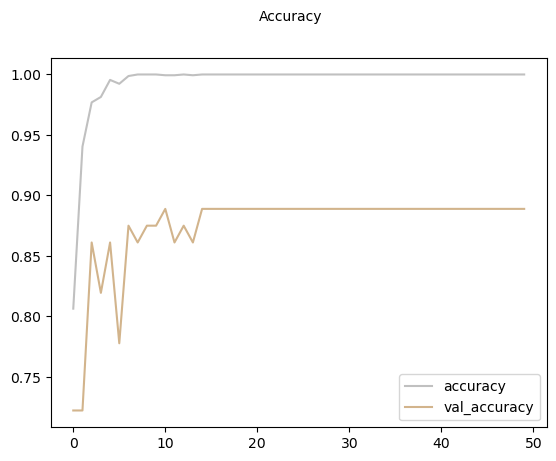

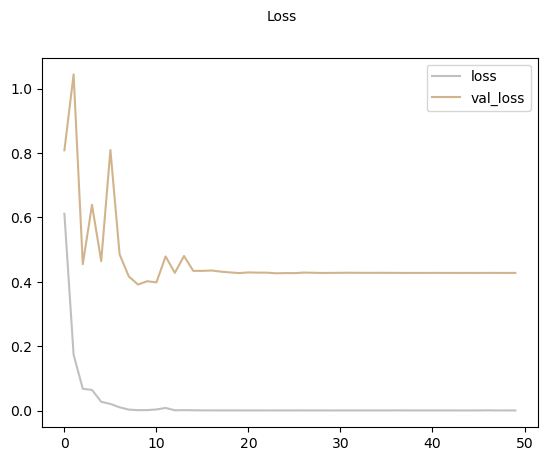

10/10 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step
              precision    recall  f1-score   support

           0     0.9048    0.7917    0.8444       120
           1     0.6944    0.9804    0.8130        51
           2     1.0000    0.9815    0.9907        54
           3     0.8824    0.8333    0.8571        90

    accuracy                         0.8667       315
   macro avg     0.8704    0.8967    0.8763       315
weighted avg     0.8806    0.8667    0.8680       315

The Cohen's Kappa Score is: 0.8173686172195304


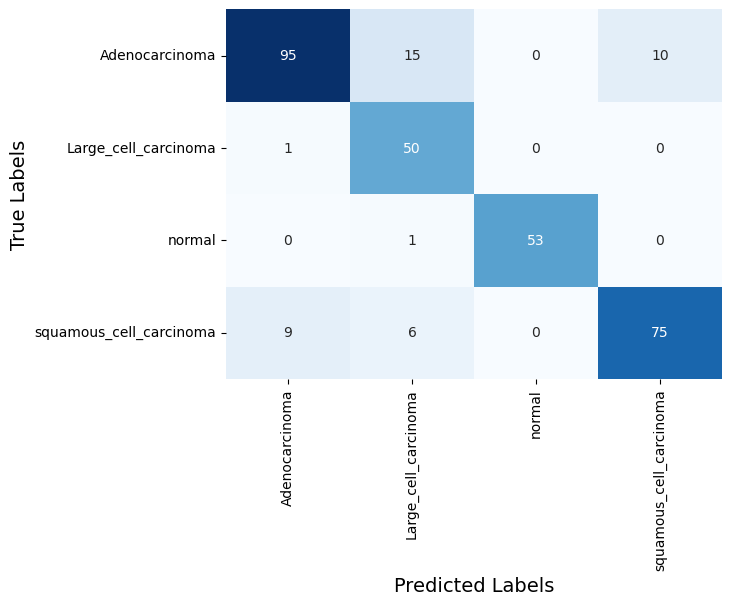

CPU times: total: 20min 56s
Wall time: 1h 30min 52s


In [66]:
%%time

model_name = 'densenet201'
epoch_num = 50
batch = 16

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

x_train_smt = tf.image.resize(x_train_smt, (224, 224)).numpy()
x_val = tf.image.resize(x_val, (224, 224)).numpy()
x_test = tf.image.resize(x_test, (224, 224)).numpy()


def build_model_DenseNet201():
    base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_DenseNet201 = build_model_DenseNet201()
model_DenseNet201.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7)

history_DenseNet201 = model_DenseNet201.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_DenseNet201.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_DenseNet201.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_DenseNet201.history['loss'], color='silver', label='loss')
plt.plot(history_DenseNet201.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_DenseNet201.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

Model: "functional_27"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_27      │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_26   │ (None, 230, 230,  │          0 │ input_layer_27[0… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_27   │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_2… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 20,297,284 (77.43 MB)

 Trainable params: 2,259,652 (8.62 MB)

 Non-trainable params: 18,037,632 (68.81 MB)

Epoch 1/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 119s 2s/step - accuracy: 0.6835 - loss: 0.9684 - val_accuracy: 0.6111 - val_loss: 1.2505 - learning_rate: 0.0010
Epoch 2/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 83s 2s/step - accuracy: 0.9499 - loss: 0.1370 - val_accuracy: 0.5972 - val_loss: 1.8941 - learning_rate: 0.0010
Epoch 3/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.9828 - loss: 0.0526 - val_accuracy: 0.7361 - val_loss: 0.8452 - learning_rate: 0.0010
Epoch 4/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.9906 - loss: 0.0360 - val_accuracy: 0.7500 - val_loss: 1.0005 - learning_rate: 0.0010
Epoch 5/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.9932 - loss: 0.0274 - val_accuracy: 0.7917 - val_loss: 0.8179 - learning_rate: 0.0010
Epoch 6/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - accuracy: 0.9977 - loss: 0.0190 - val_accuracy: 0.8333 - val_loss: 0.7199 - learning_rate: 0.0010
Epoch 7/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.9991 - loss: 0.0089 - val_accuracy:

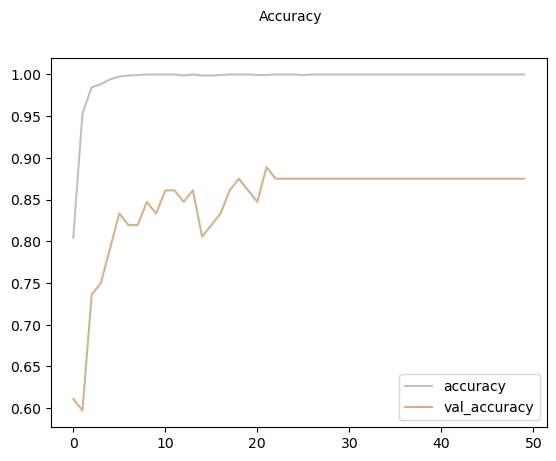

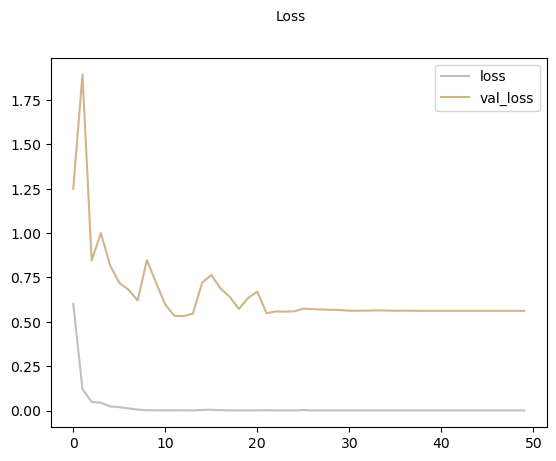

10/10 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step
              precision    recall  f1-score   support

           0     0.8522    0.8167    0.8340       120
           1     0.8276    0.9412    0.8807        51
           2     0.9298    0.9815    0.9550        54
           3     0.8588    0.8111    0.8343        90

    accuracy                         0.8635       315
   macro avg     0.8671    0.8876    0.8760       315
weighted avg     0.8634    0.8635    0.8624       315

The Cohen's Kappa Score is: 0.8111905658010288


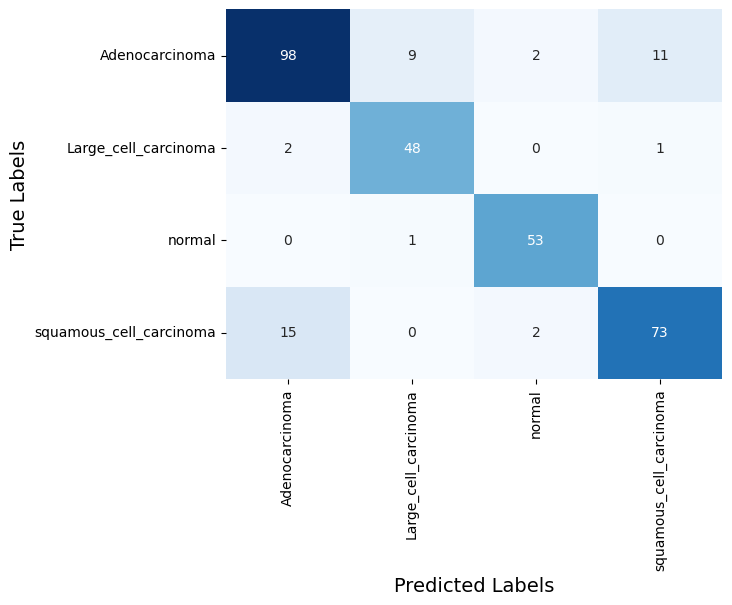

CPU times: total: 32min 36s
Wall time: 1h 8min 14s


In [82]:
%%time

model_name = 'densenet201'
epoch_num = 50
batch = 32

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

x_train_smt = tf.image.resize(x_train_smt, (224, 224)).numpy()
x_val = tf.image.resize(x_val, (224, 224)).numpy()
x_test = tf.image.resize(x_test, (224, 224)).numpy()


def build_model_DenseNet201():
    base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_DenseNet201 = build_model_DenseNet201()
model_DenseNet201.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7)

history_DenseNet201 = model_DenseNet201.fit(x_train_smt, y_train_smt, batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_DenseNet201.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_DenseNet201.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_DenseNet201.history['loss'], color='silver', label='loss')
plt.plot(history_DenseNet201.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_DenseNet201.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

### InceptionResNetV2

Model: "functional_25"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_25      │ (None, 299, 299,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_406 (Conv2D) │ (None, 149, 149,  │        864 │ input_layer_25[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 149, 149,  │         96 │ conv2d_406[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_782      │ (None, 149, 149,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_407 (Conv2D) │ (None, 147, 147,  │      9,216 │ activation_782[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │         96 │ conv2d_407[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_783      │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_408 (Conv2D) │ (None, 147, 147,  │     18,432 │ activation_783[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │        192 │ conv2d_408[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_784      │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_20    │ (None, 73, 73,    │          0 │ activation_784[0… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_409 (Conv2D) │ (None, 73, 73,    │      5,120 │ max_pooling2d_20… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 73, 73,    │        240 │ conv2d_409[0][0]  │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_785      │ (None, 73, 73,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_410 (Conv2D) │ (None, 71, 71,    │    138,240 │ activation_785[0… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 71, 71,    │        576 │ conv2d_410[0][0]  │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_786      │ (None, 71, 71,    │          0 │ batch_normalizat

 Total params: 55,918,820 (213.31 MB)

 Trainable params: 5,710,820 (21.79 MB)

 Non-trainable params: 50,208,000 (191.53 MB)

Epoch 1/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 134s 2s/step - accuracy: 0.5693 - loss: 1.4236 - val_accuracy: 0.3750 - val_loss: 1.5893 - learning_rate: 0.0010
Epoch 2/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 117s 2s/step - accuracy: 0.8062 - loss: 0.4975 - val_accuracy: 0.4167 - val_loss: 1.6600 - learning_rate: 0.0010
Epoch 3/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 121s 2s/step - accuracy: 0.8775 - loss: 0.3495 - val_accuracy: 0.4722 - val_loss: 1.8012 - learning_rate: 0.0010
Epoch 4/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 119s 2s/step - accuracy: 0.9217 - loss: 0.2068 - val_accuracy: 0.5833 - val_loss: 1.7385 - learning_rate: 0.0010
Epoch 5/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 119s 2s/step - accuracy: 0.9458 - loss: 0.1536 - val_accuracy: 0.6111 - val_loss: 1.6426 - learning_rate: 5.0000e-04
Epoch 6/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 119s 2s/step - accuracy: 0.9720 - loss: 0.0802 - val_accuracy: 0.5139 - val_loss: 2.2182 - learning_rate: 5.0000e-04
Epoch 7/50
49/49 ━━━━━━━━━━━━━━━━━━━━ 119s 2s/step - accuracy: 0.9905 - loss: 0.0399 -

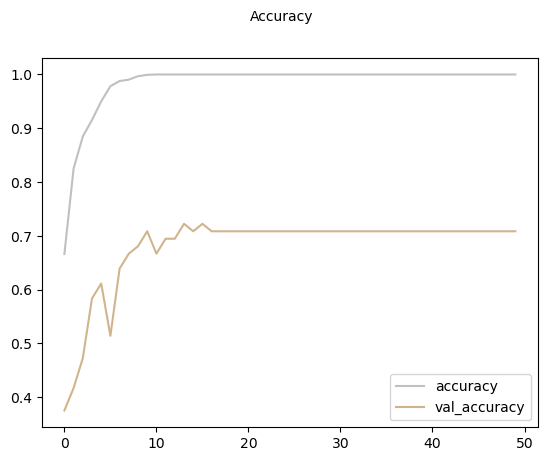

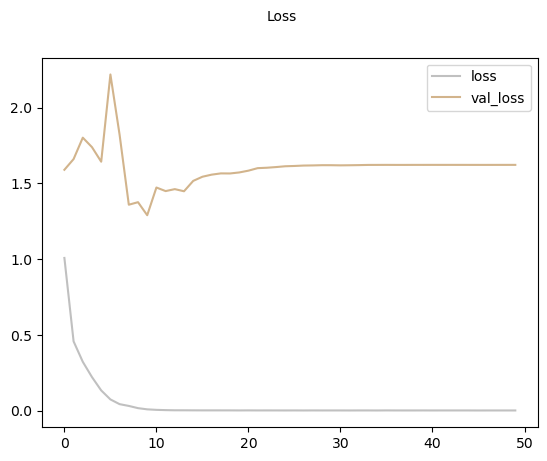

10/10 ━━━━━━━━━━━━━━━━━━━━ 28s 3s/step
              precision    recall  f1-score   support

           0     0.6111    0.5500    0.5789       120
           1     0.5694    0.8039    0.6667        51
           2     1.0000    0.9259    0.9615        54
           3     0.6000    0.5667    0.5829        90

    accuracy                         0.6603       315
   macro avg     0.6951    0.7116    0.6975       315
weighted avg     0.6679    0.6603    0.6599       315

The Cohen's Kappa Score is: 0.5334496075744363


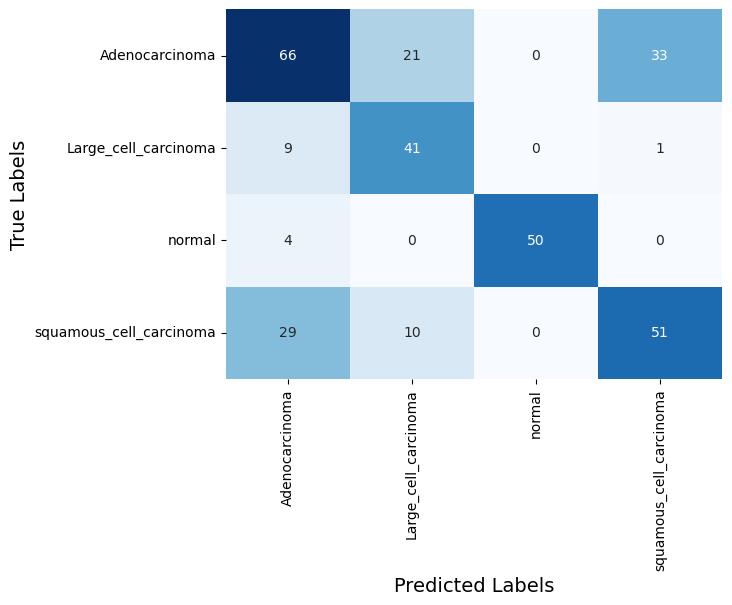

CPU times: total: 2h 36s
Wall time: 1h 40min 28s


In [67]:
%%time
from tensorflow.keras.applications import InceptionResNetV2

model_name = 'inceptionresnetv2'
epoch_num = 50
batch = 32

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

x_train_smt = tf.image.resize(x_train_smt, (299, 299)).numpy()
x_val = tf.image.resize(x_val, (299, 299)).numpy()
x_test = tf.image.resize(x_test, (299, 299)).numpy()


def build_model_inceptionresnetv2():
    base_model = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_inceptionresnetv2 = build_model_inceptionresnetv2()
model_inceptionresnetv2.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7)

history_inceptionresnetv2 = model_inceptionresnetv2.fit(x_train_smt, y_train_smt,batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_inceptionresnetv2.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_inceptionresnetv2.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_inceptionresnetv2.history['loss'], color='silver', label='loss')
plt.plot(history_inceptionresnetv2.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_inceptionresnetv2.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_15      │ (None, 299, 299,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_203 (Conv2D) │ (None, 149, 149,  │        864 │ input_layer_15[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 149, 149,  │         96 │ conv2d_203[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_579      │ (None, 149, 149,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_204 (Conv2D) │ (None, 147, 147,  │      9,216 │ activation_579[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │         96 │ conv2d_204[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_580      │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_205 (Conv2D) │ (None, 147, 147,  │     18,432 │ activation_580[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │        192 │ conv2d_205[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_581      │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_13    │ (None, 73, 73,    │          0 │ activation_581[0… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_206 (Conv2D) │ (None, 73, 73,    │      5,120 │ max_pooling2d_13… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 73, 73,    │        240 │ conv2d_206[0][0]  │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_582      │ (None, 73, 73,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_207 (Conv2D) │ (None, 71, 71,    │    138,240 │ activation_582[0… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 71, 71,    │        576 │ conv2d_207[0][0]  │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_583      │ (None, 71, 71,    │          0 │ batch_normalizat

 Total params: 55,918,820 (213.31 MB)

 Trainable params: 5,710,820 (21.79 MB)

 Non-trainable params: 50,208,000 (191.53 MB)

Epoch 1/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 124s 1s/step - accuracy: 0.5054 - loss: 1.5790 - val_accuracy: 0.5000 - val_loss: 1.0928 - learning_rate: 0.0010
Epoch 2/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 108s 1s/step - accuracy: 0.7763 - loss: 0.6173 - val_accuracy: 0.5139 - val_loss: 1.2251 - learning_rate: 0.0010
Epoch 3/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 108s 1s/step - accuracy: 0.8448 - loss: 0.4313 - val_accuracy: 0.6806 - val_loss: 0.9994 - learning_rate: 0.0010
Epoch 4/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 110s 1s/step - accuracy: 0.8856 - loss: 0.2963 - val_accuracy: 0.7083 - val_loss: 0.9704 - learning_rate: 0.0010
Epoch 5/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 107s 1s/step - accuracy: 0.9293 - loss: 0.2109 - val_accuracy: 0.6806 - val_loss: 1.5492 - learning_rate: 0.0010
Epoch 6/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 107s 1s/step - accuracy: 0.9124 - loss: 0.2122 - val_accuracy: 0.6528 - val_loss: 1.4379 - learning_rate: 0.0010
Epoch 7/50
98/98 ━━━━━━━━━━━━━━━━━━━━ 105s 1s/step - accuracy: 0.9385 - loss: 0.1568 - val_acc

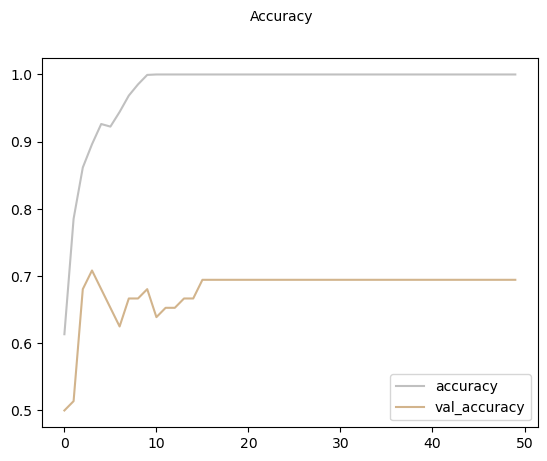

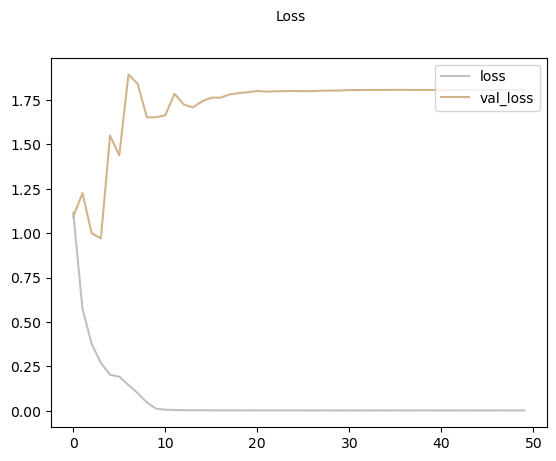

10/10 ━━━━━━━━━━━━━━━━━━━━ 24s 2s/step
              precision    recall  f1-score   support

           0     0.6500    0.5417    0.5909       120
           1     0.6491    0.7255    0.6852        51
           2     1.0000    0.9259    0.9615        54
           3     0.5463    0.6556    0.5960        90

    accuracy                         0.6698       315
   macro avg     0.7114    0.7122    0.7084       315
weighted avg     0.6802    0.6698    0.6712       315

The Cohen's Kappa Score is: 0.5443545022114662


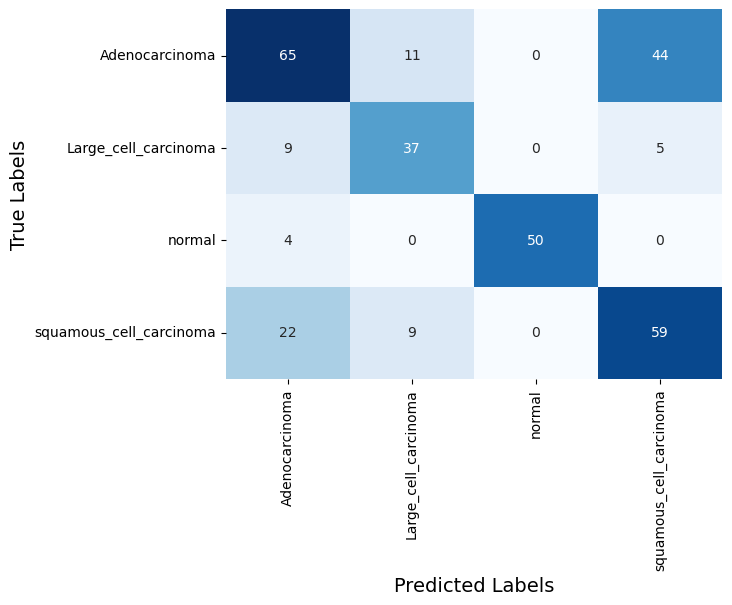

CPU times: total: 1h 9min 8s
Wall time: 1h 26min 7s


In [48]:
%%time
from tensorflow.keras.applications import InceptionResNetV2

model_name = 'inceptionresnetv2'
epoch_num = 50
batch = 16

#x_train_smt = np.repeat(x_train_smt, 3, axis=-1)
#x_val = np.expand_dims(x_val, axis=-1)
#x_val = np.repeat(x_val, 3, axis=-1)
#x_test = np.expand_dims(x_test, axis=-1)
#x_test = np.repeat(x_test, 3, axis=-1)

x_train_smt = tf.image.resize(x_train_smt, (299, 299)).numpy()
x_val = tf.image.resize(x_val, (299, 299)).numpy()
x_test = tf.image.resize(x_test, (299, 299)).numpy()


def build_model_inceptionresnetv2():
    base_model = InceptionResNetV2(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
    base_model.trainable = True
    for layer in base_model.layers[:-10]:  
        layer.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model_inceptionresnetv2 = build_model_inceptionresnetv2()
model_inceptionresnetv2.summary()

lr_reducer = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-7)

history_inceptionresnetv2 = model_inceptionresnetv2.fit(x_train_smt, y_train_smt,batch_size = batch, epochs = epoch_num, validation_data = (x_val, y_val), callbacks=[lr_reducer, tensorboard_callback])

fig = plt.figure()
plt.plot(history_inceptionresnetv2.history['accuracy'], color='silver', label='accuracy')
plt.plot(history_inceptionresnetv2.history['val_accuracy'], color='tan', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=10)
plt.legend(loc="lower right")
plt.show()

fig = plt.figure()
plt.plot(history_inceptionresnetv2.history['loss'], color='silver', label='loss')
plt.plot(history_inceptionresnetv2.history['val_loss'], color='tan', label='val_loss')
fig.suptitle('Loss', fontsize=10)
plt.legend(loc="upper right")
plt.show()

y_pred = model_inceptionresnetv2.predict(x_test)

y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test, axis=1)

all_evaluation(y_test_labels, y_pred_labels, model_name, epoch_num, batch)